In [52]:
import yfinance as yf
import numpy as np
import os
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

In [183]:
TICKERS = ["SPY", "SH", "SDS", "UPRO", "SSO", "SPXU"]
LEVERAGES = {"SPY": "1x", "SSO": "2x", "UPRO": "3x", "SH":"-1x", "SDS":"-2x", "SPXU": "-3x"}

In [195]:
TICKERS2INDEX = {'SPY': 0, 'SH': 1, 'SDS': 2, 'UPRO': 3, 'SSO': 4, 'SPXU': 5}

In [283]:
# sns.set(rc={'figure.figsize':(8,5)})

## 1. Data Exploration - Close Price version

In [106]:
def collect_historical(ticker):
    ticker_class = yf.Ticker(ticker)
    
    # Get historical adjusted price, from the first day traded
    # Adjusted for both dividends and splits
    hist = ticker_class.history(period="max")
    
    return hist

In [107]:
data = dict()

for ticker in TICKERS:
    data[ticker] = collect_historical(ticker)

In [142]:
def plot(y_ticker, x_ticker, period=None, price_type="Close"):
    """ 
    Usage: To do a linear regression of y=SPY on x=SH, call `plot("SPY", "SH")`
    This function plots two graph about the relationship between two tickers, and do OLS with them.
        plot 1: The scatter plot of two etf prices
        plot 2: The lineplot of two etf prices over time
    Arguments:
        y_ticker: ticker of the etf to be the dependent variable
        x_ticker: ticker of the etf to be the independent variable
        period (day): If given, use the last `period` number of closed price 
                    If not given, use all the data since both tickers are traded
    """
    
    y = data[y_ticker][price_type] if y_ticker in data else collect_historical(y_ticker)
    x = data[x_ticker][price_type] if x_ticker in data else collect_historical(x_ticker)
    
    period = min(len(y), len(x)) if period == None else period
    y = y[-period:]
    x = x[-period:]
    
    data_pair = pd.DataFrame()
    data_pair[x_ticker], data_pair[y_ticker], data_pair["Year"] = x, y, list(map(lambda x: str(x.year), x.index))
    
    plt.figure(figsize=(20,8))
    plt.subplot(1,2,1)
    plt.title("Relationship between {} and {}".format(y_ticker, x_ticker), fontsize=20)
    sns.scatterplot(data=data_pair, x=x_ticker, y=y_ticker, hue="Year")
    
    x = sm.add_constant(x)
    model = sm.OLS(y, x)
    result = model.fit()
    constant = result.params[0]
    slope = result.params[1]
    plt.text((max(x["Close"]) + min(x["Close"])) / 2, 0.95*max(y), r'${}={}*{} + {}$'.format(
        y_ticker, round(slope, 2), x_ticker, round(constant, 2)), fontsize=20, ha='center')
    
    plt.subplot(1,2,2)
    plt.title("Price Movement of {} and {}".format(y_ticker, x_ticker), fontsize=20)
    sns.lineplot(data=data_pair)
    plt.ylabel("Price")
    plt.show()
    plt.close()
    
    return data_pair, slope, constant

### Use all the data since the ticker is first traded

1. Relationship between SPY(1x) and SH(-1x)


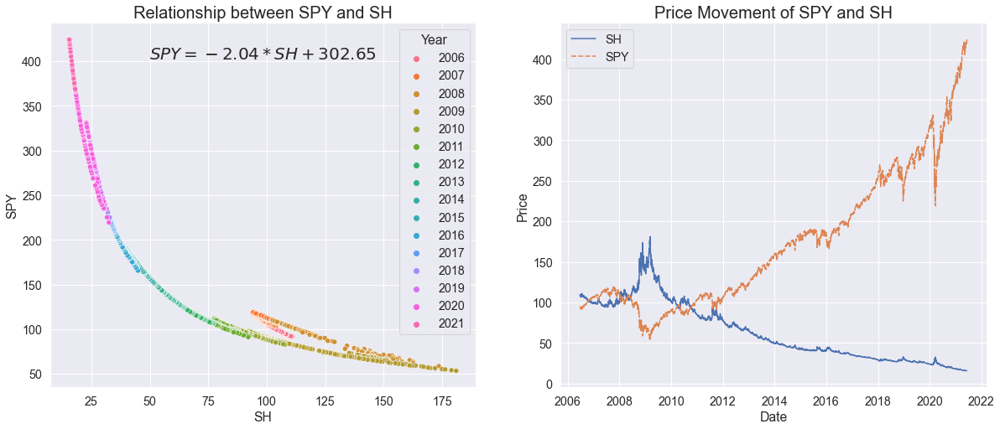

2. Relationship between SPY(1x) and SDS(-2x)


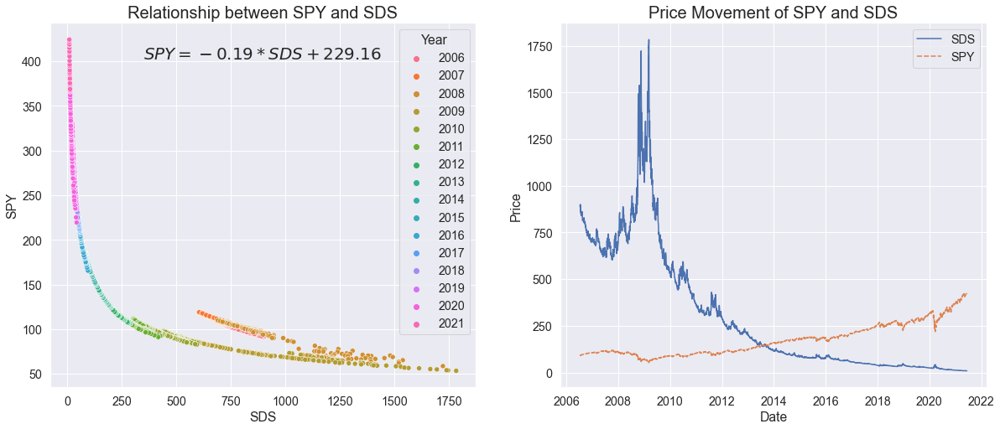

3. Relationship between SPY(1x) and UPRO(3x)


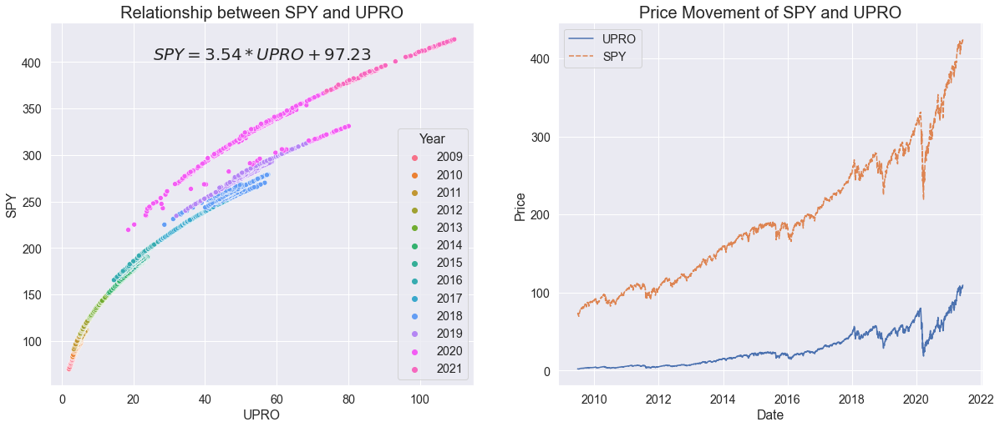

4. Relationship between SPY(1x) and SSO(2x)


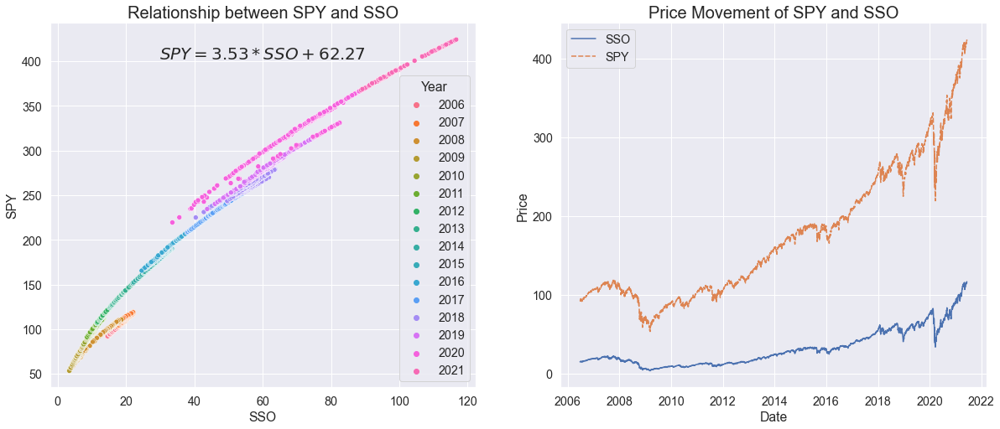

5. Relationship between SPY(1x) and SPXU(-3x)


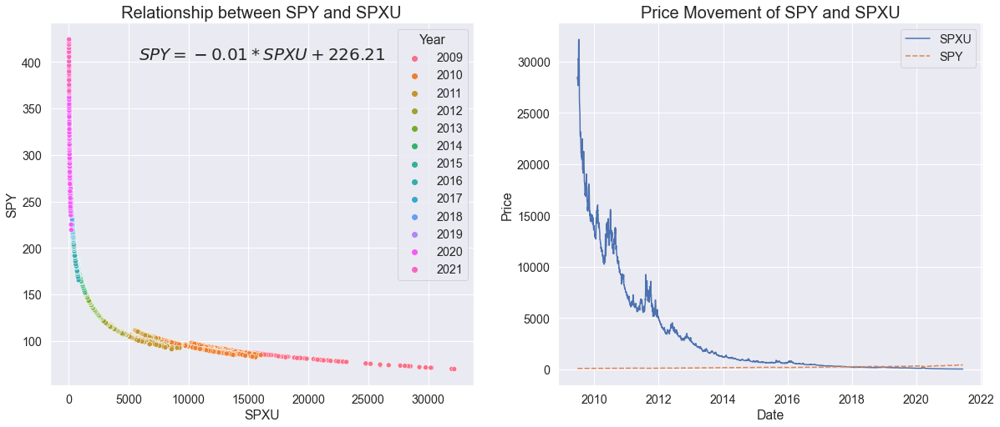

6. Relationship between SH(-1x) and SDS(-2x)


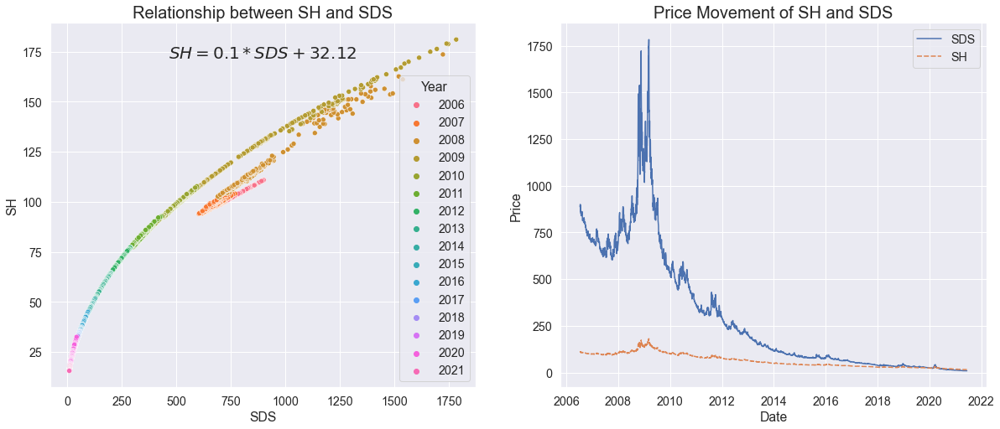

7. Relationship between SH(-1x) and UPRO(3x)


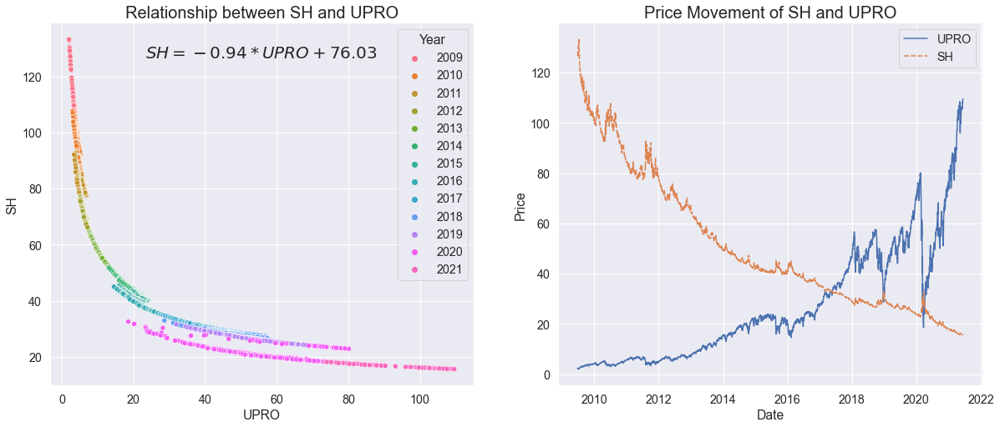

8. Relationship between SH(-1x) and SSO(2x)


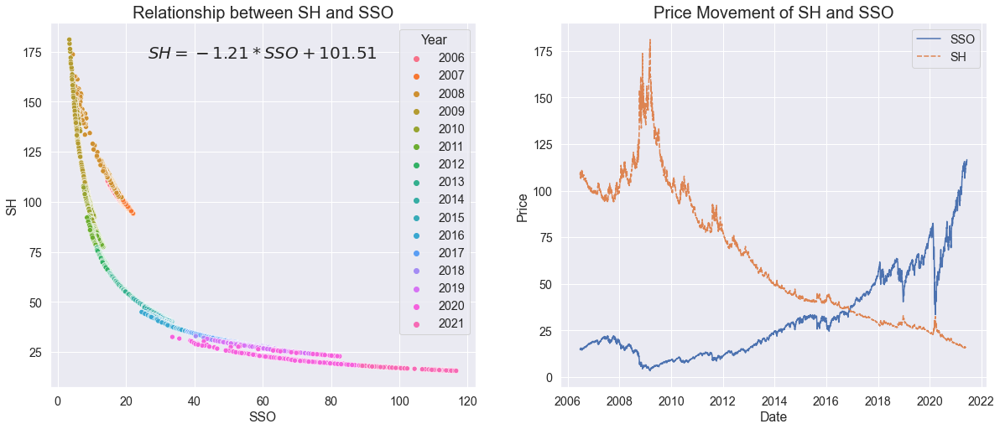

9. Relationship between SH(-1x) and SPXU(-3x)


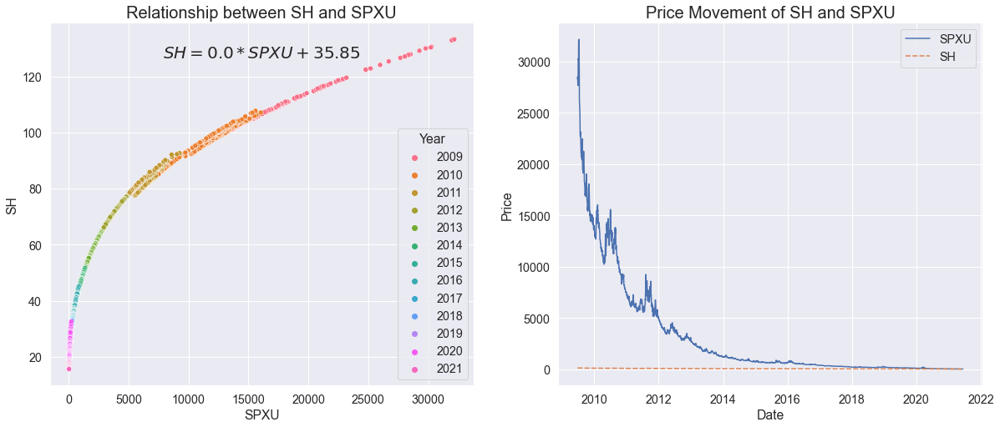

10. Relationship between SDS(-2x) and UPRO(3x)


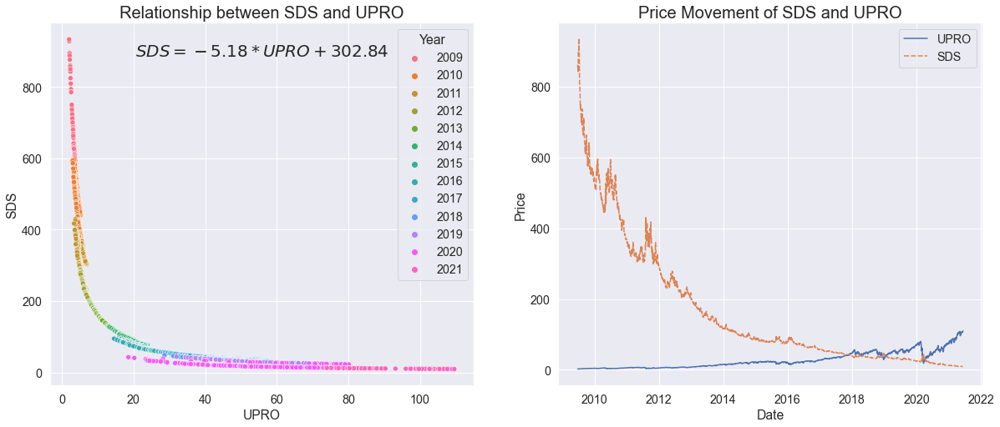

11. Relationship between SDS(-2x) and SSO(2x)


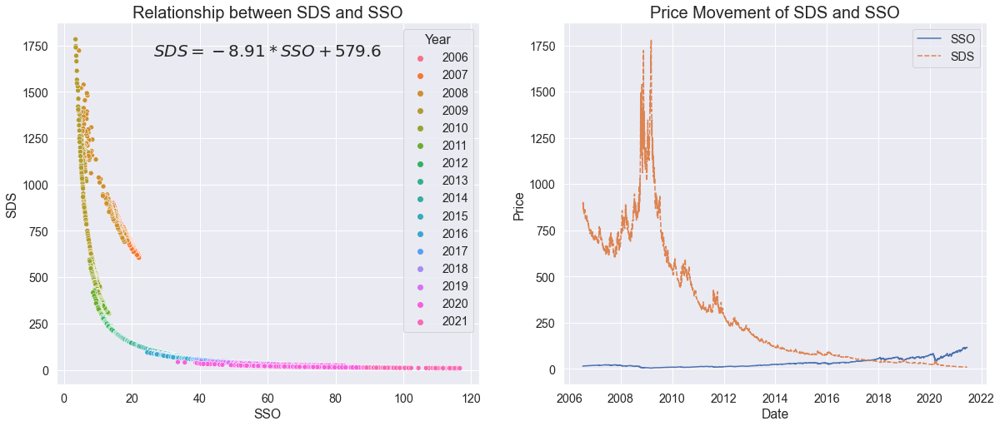

12. Relationship between SDS(-2x) and SPXU(-3x)


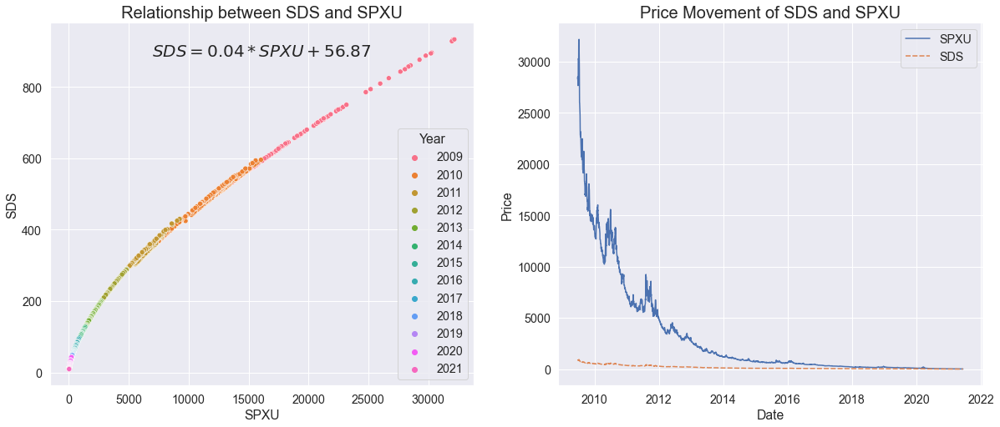

13. Relationship between UPRO(3x) and SSO(2x)


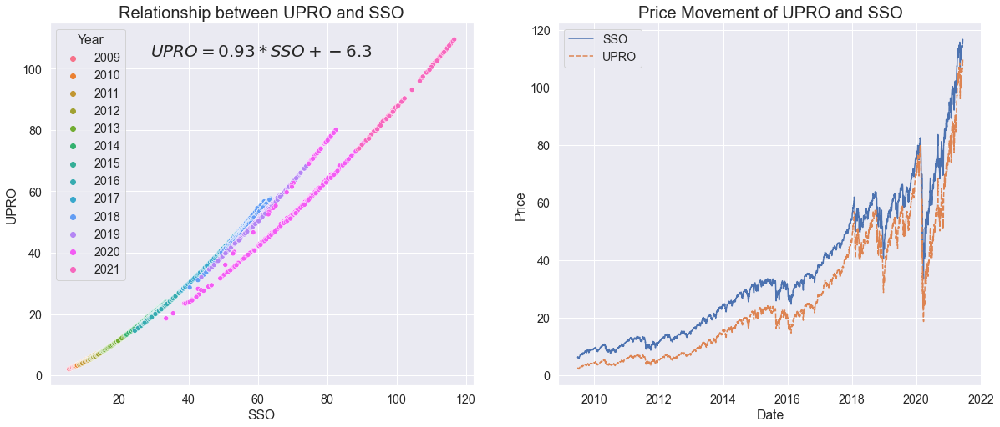

14. Relationship between UPRO(3x) and SPXU(-3x)


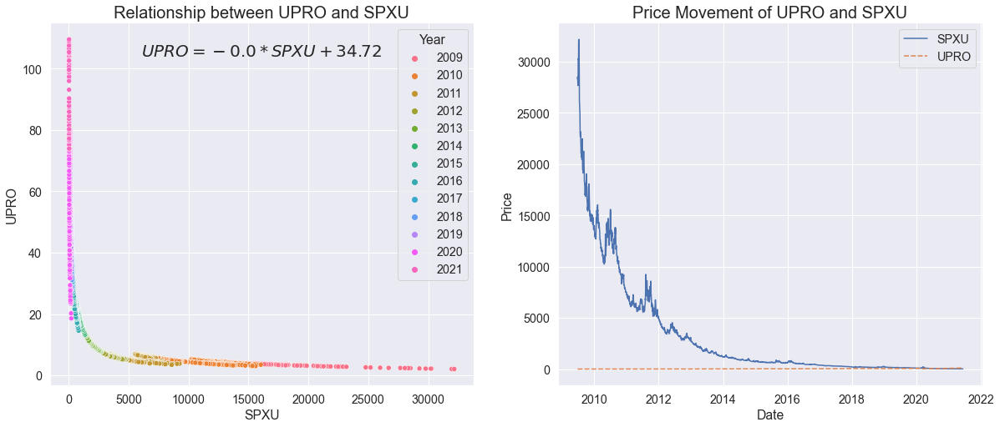

15. Relationship between SSO(2x) and SPXU(-3x)


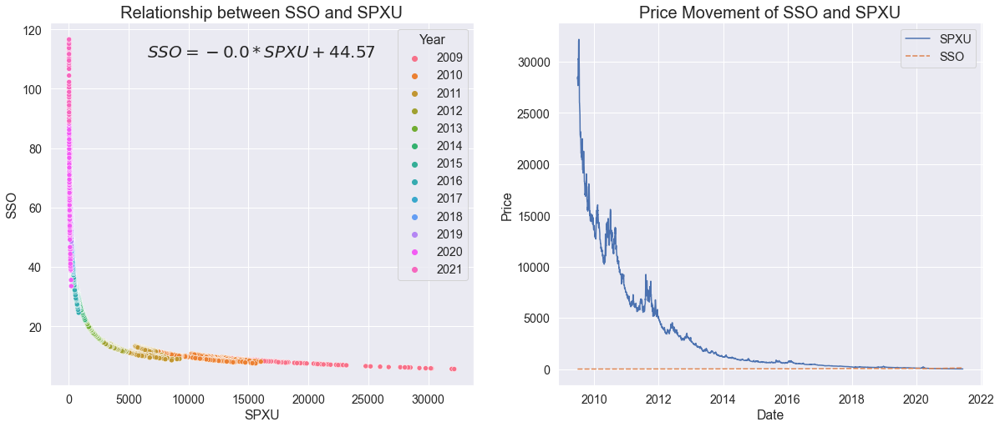

In [287]:
period = None # Number of samples to plot
for i, (x_ticker, y_ticker) in enumerate(itertools.combinations(TICKERS, 2)):
    print("{}. Relationship between {}({}) and {}({})".format(i + 1, x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
    data_pair, slope, constant = plot(x_ticker, y_ticker, period)

### Use two years data

1. Relationship between SPY(1x) and SH(-1x)


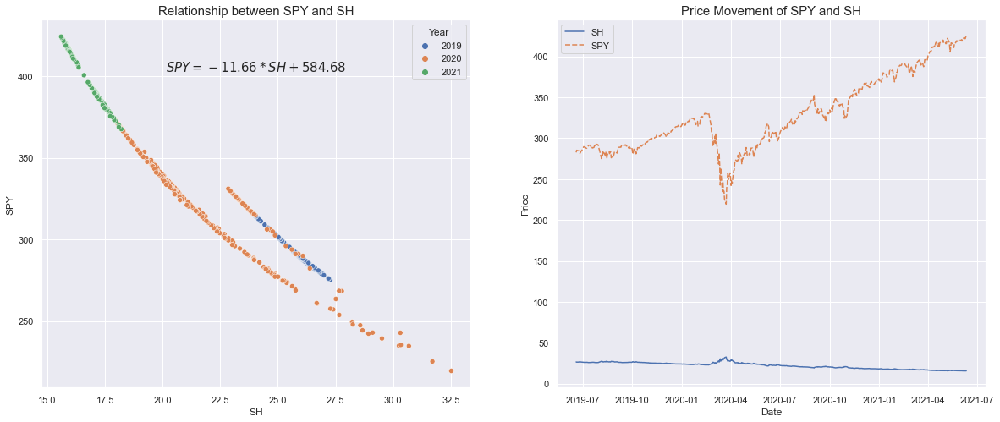

2. Relationship between SPY(1x) and SDS(-2x)


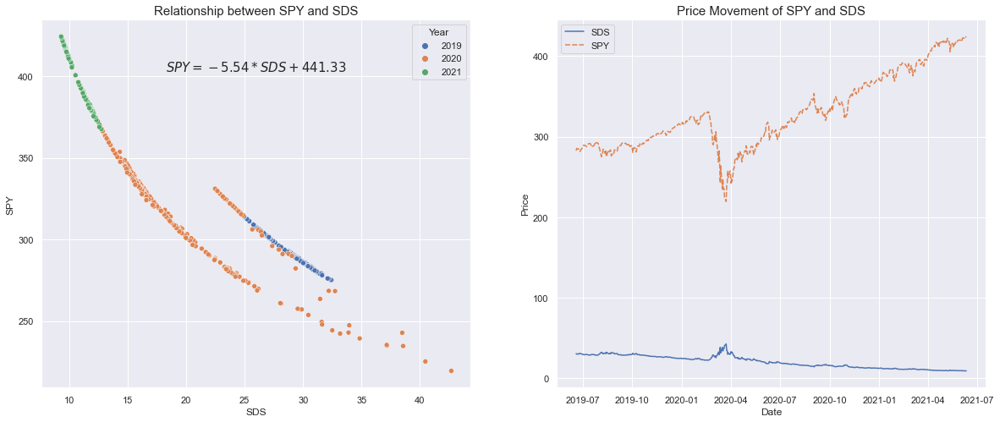

3. Relationship between SPY(1x) and UPRO(3x)


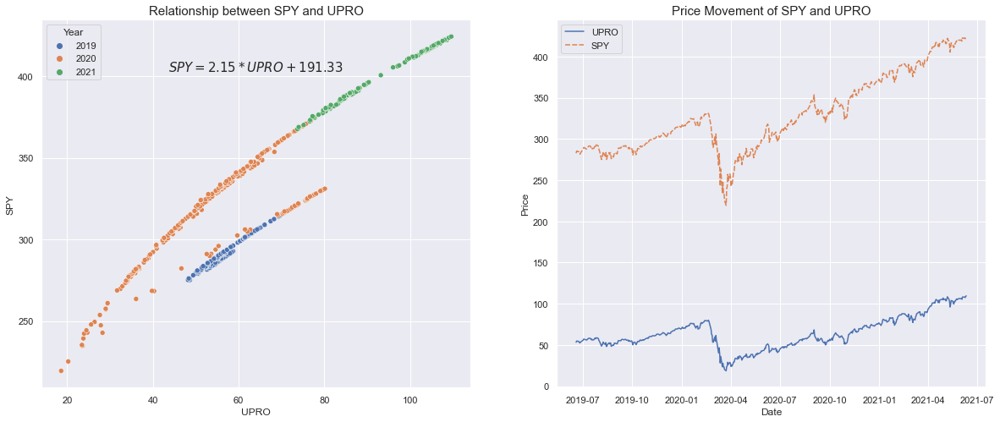

4. Relationship between SPY(1x) and SSO(2x)


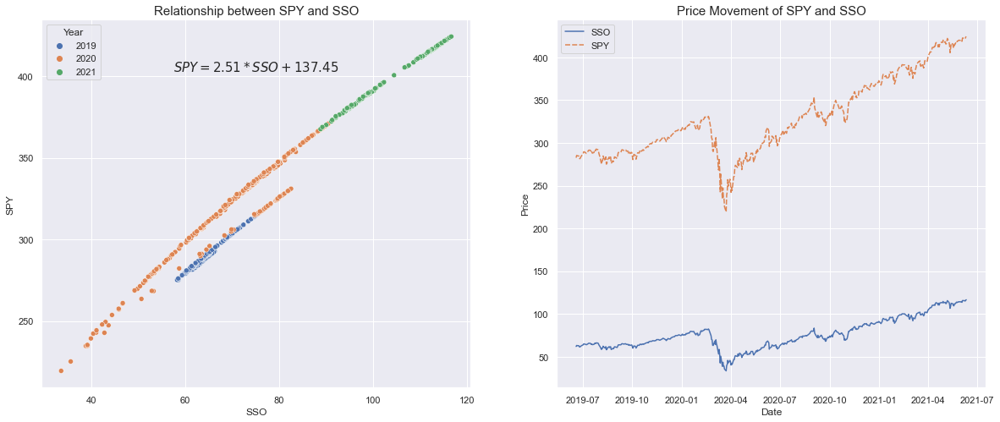

5. Relationship between SPY(1x) and SPXU(-3x)


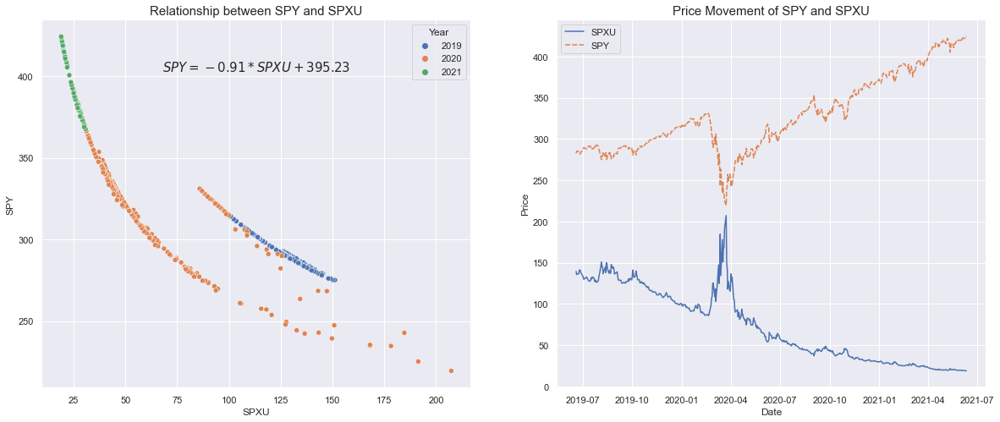

6. Relationship between SH(-1x) and SDS(-2x)


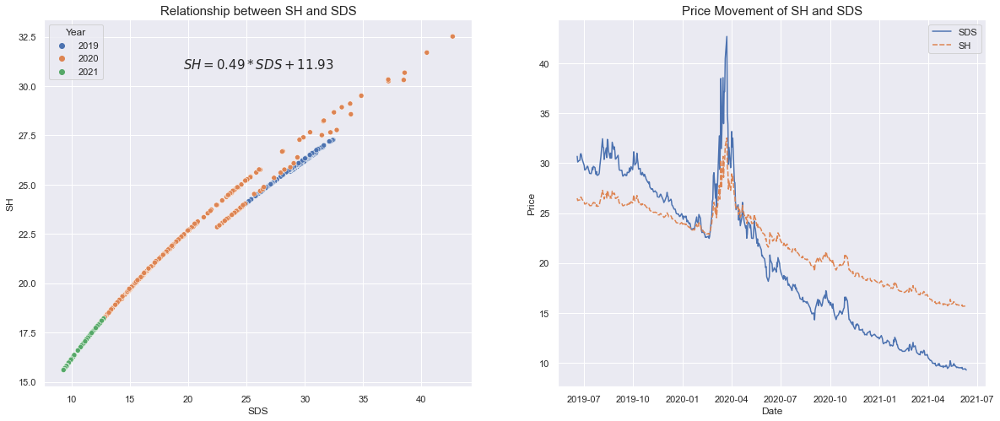

7. Relationship between SH(-1x) and UPRO(3x)


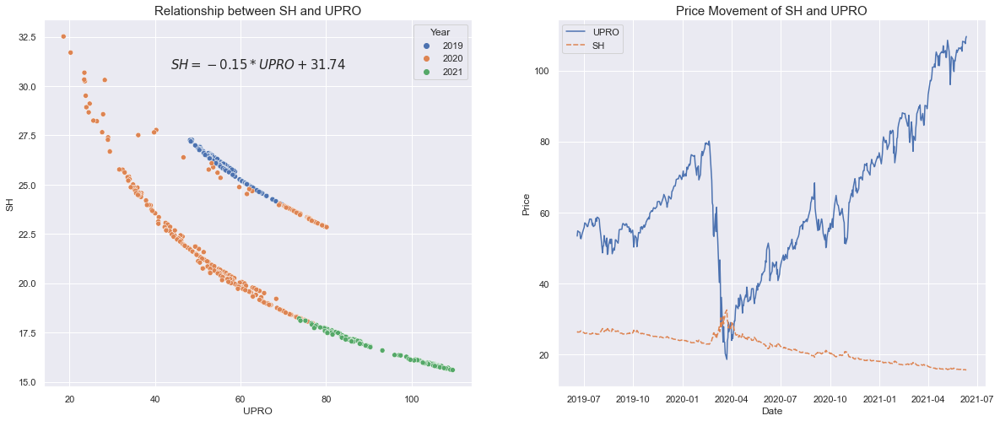

8. Relationship between SH(-1x) and SSO(2x)


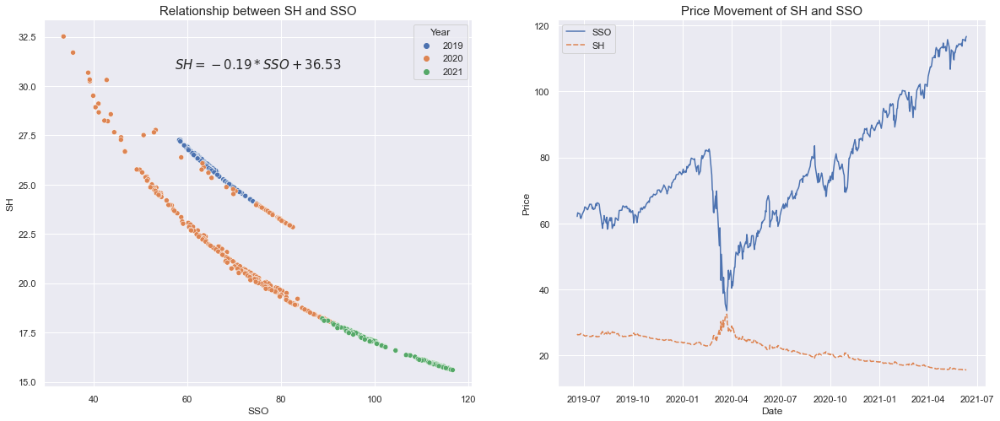

9. Relationship between SH(-1x) and SPXU(-3x)


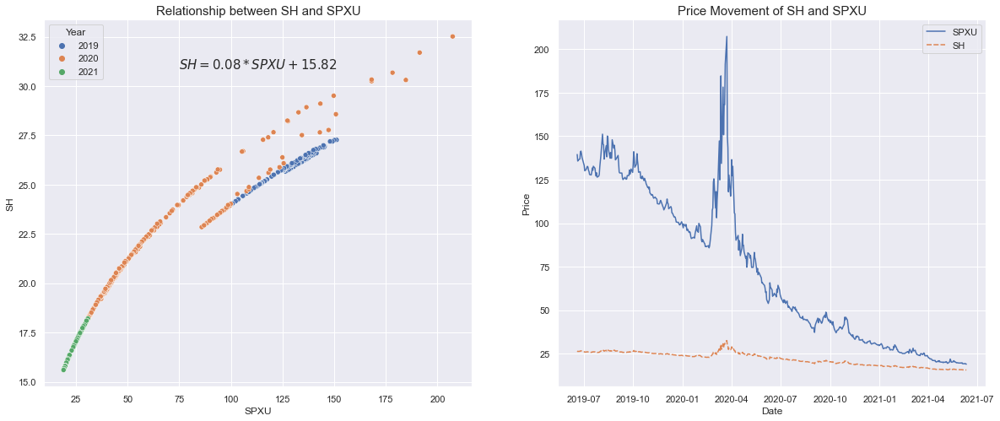

10. Relationship between SDS(-2x) and UPRO(3x)


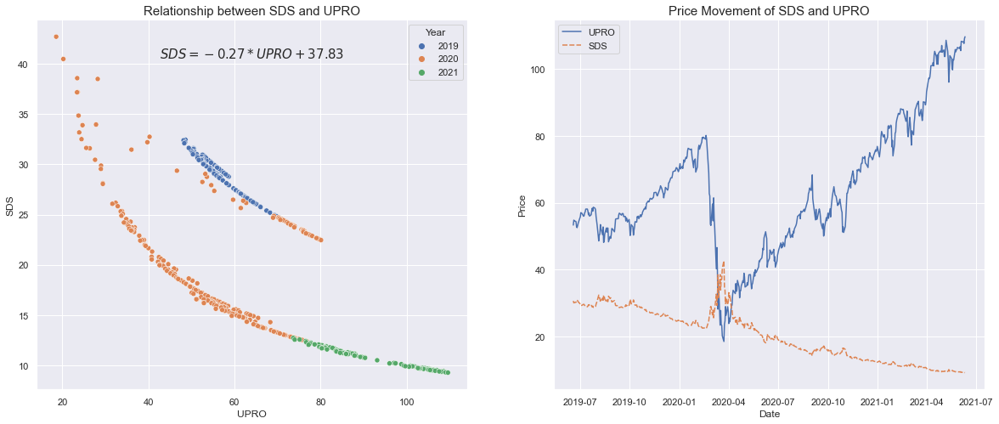

11. Relationship between SDS(-2x) and SSO(2x)


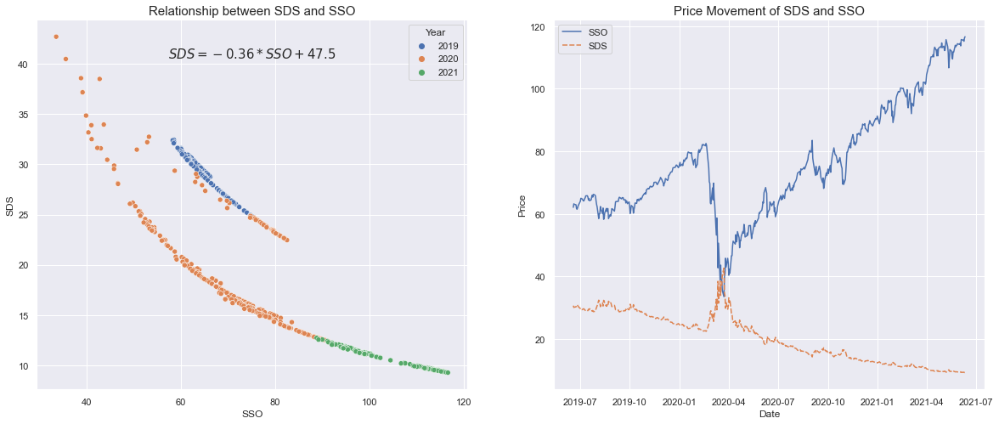

12. Relationship between SDS(-2x) and SPXU(-3x)


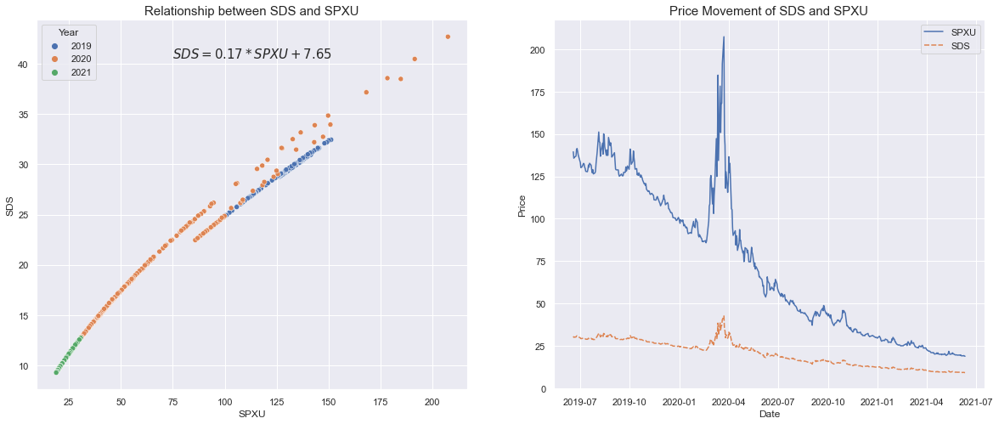

13. Relationship between UPRO(3x) and SSO(2x)


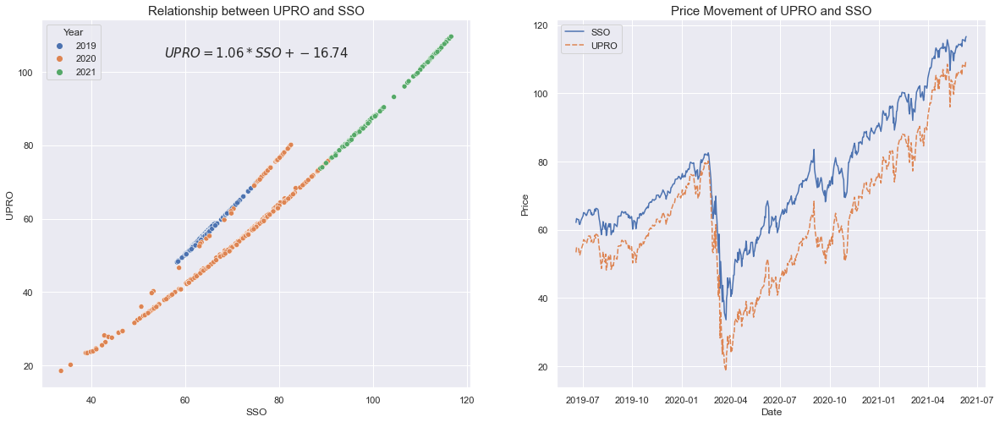

14. Relationship between UPRO(3x) and SPXU(-3x)


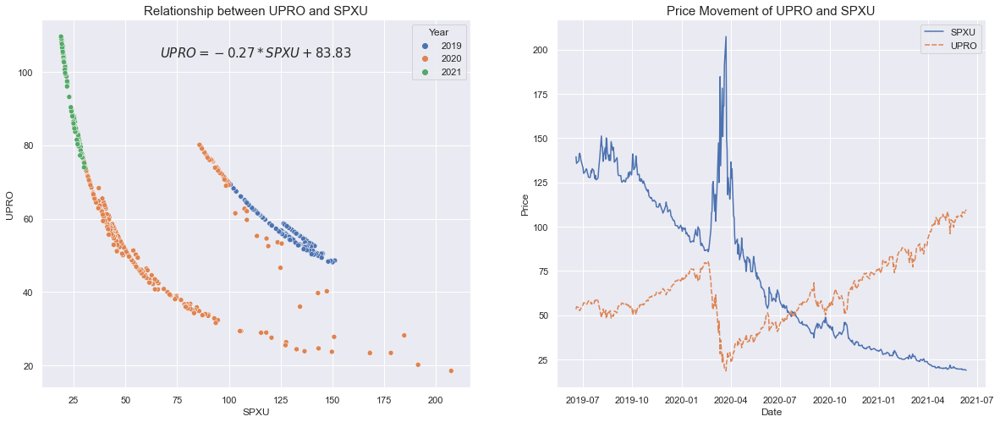

15. Relationship between SSO(2x) and SPXU(-3x)


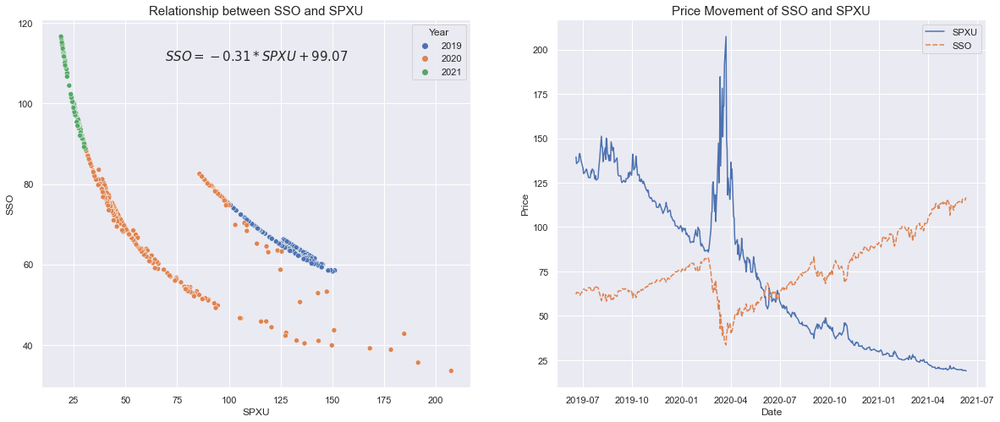

In [249]:
period = 500 # Number of samples to plot
for i, (x_ticker, y_ticker) in enumerate(itertools.combinations(TICKERS, 2)):
    print("{}. Relationship between {}({}) and {}({})".format(i + 1, x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
    data_pair, slope, constant= plot(x_ticker, y_ticker, period)

### Use one year data

1. Relationship between SPY(1x) and SH(-1x)


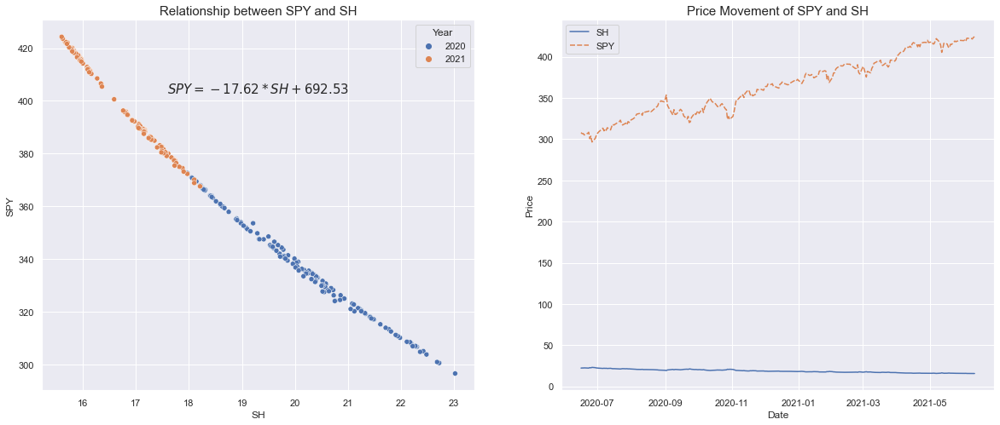

2. Relationship between SPY(1x) and SDS(-2x)


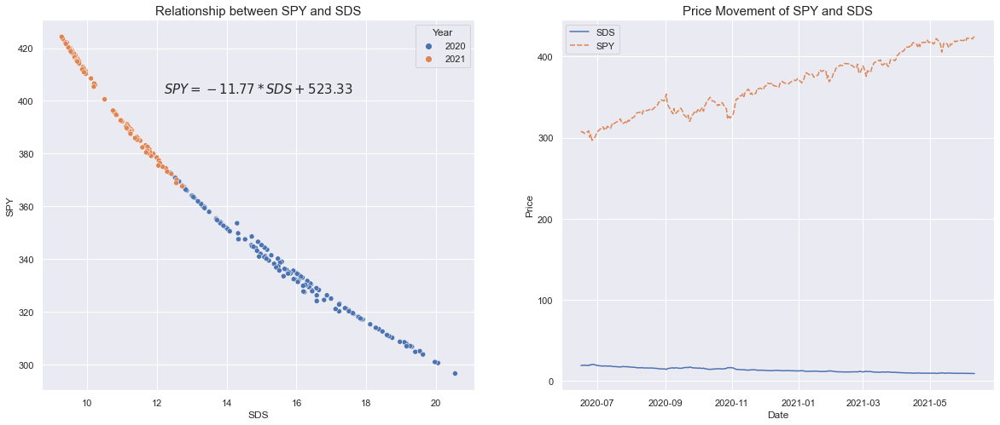

3. Relationship between SPY(1x) and UPRO(3x)


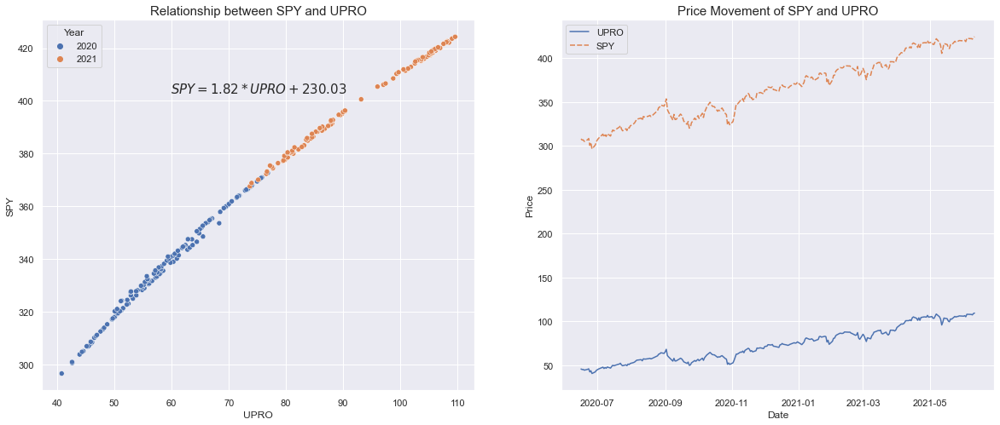

4. Relationship between SPY(1x) and SSO(2x)


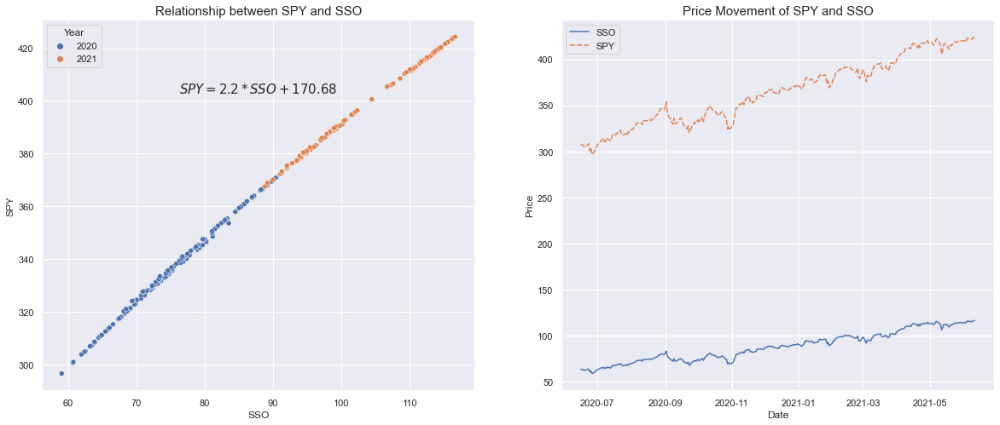

5. Relationship between SPY(1x) and SPXU(-3x)


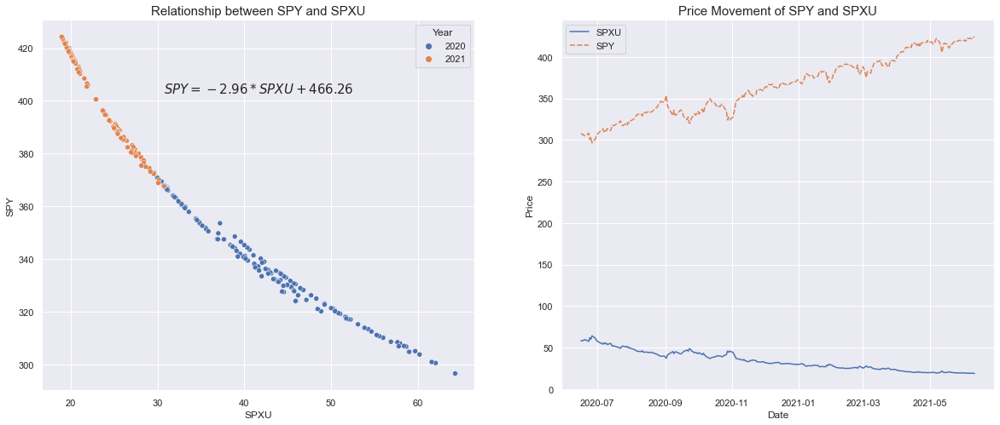

6. Relationship between SH(-1x) and SDS(-2x)


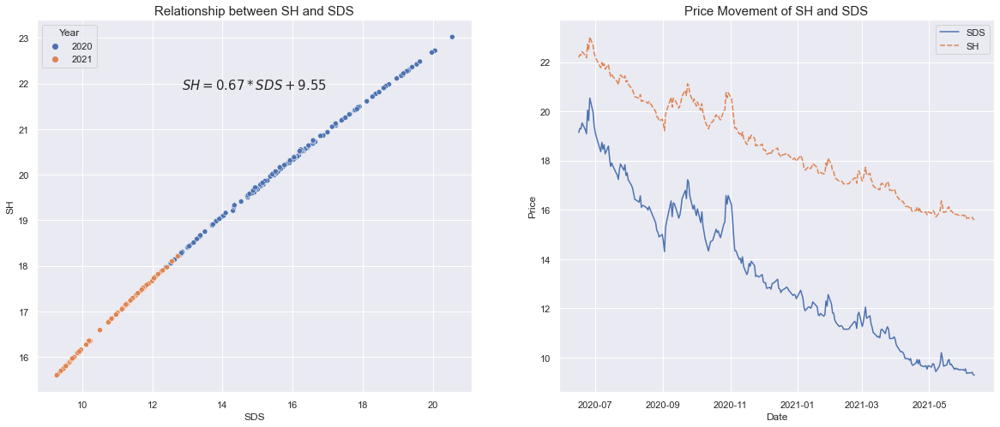

7. Relationship between SH(-1x) and UPRO(3x)


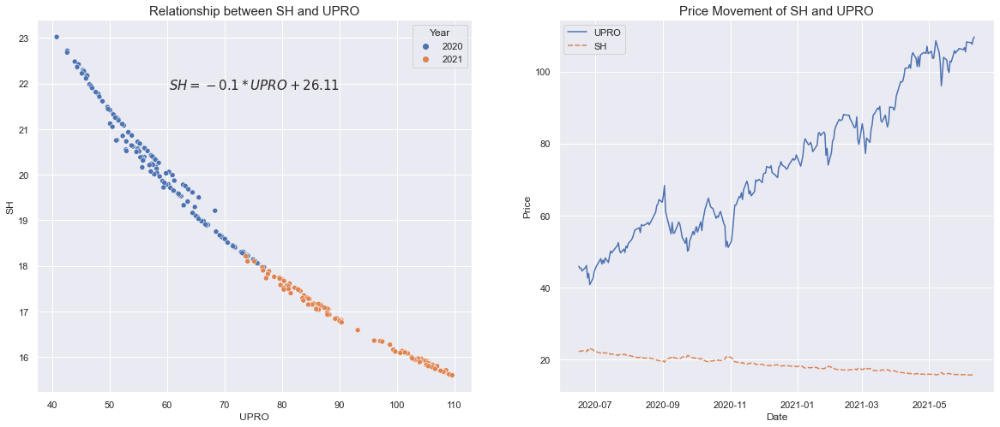

8. Relationship between SH(-1x) and SSO(2x)


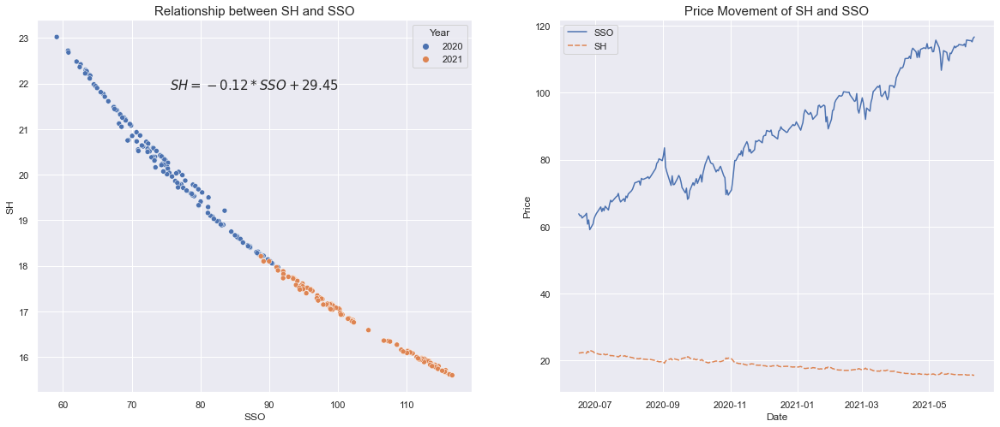

9. Relationship between SH(-1x) and SPXU(-3x)


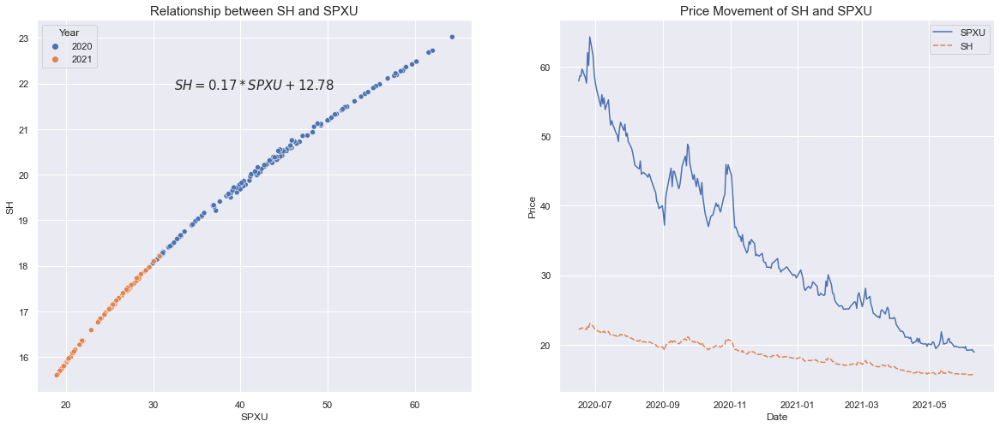

10. Relationship between SDS(-2x) and UPRO(3x)


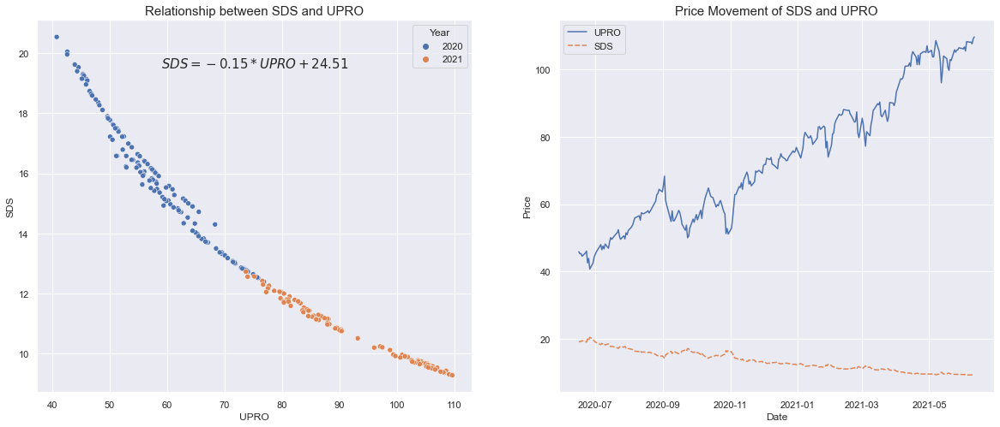

11. Relationship between SDS(-2x) and SSO(2x)


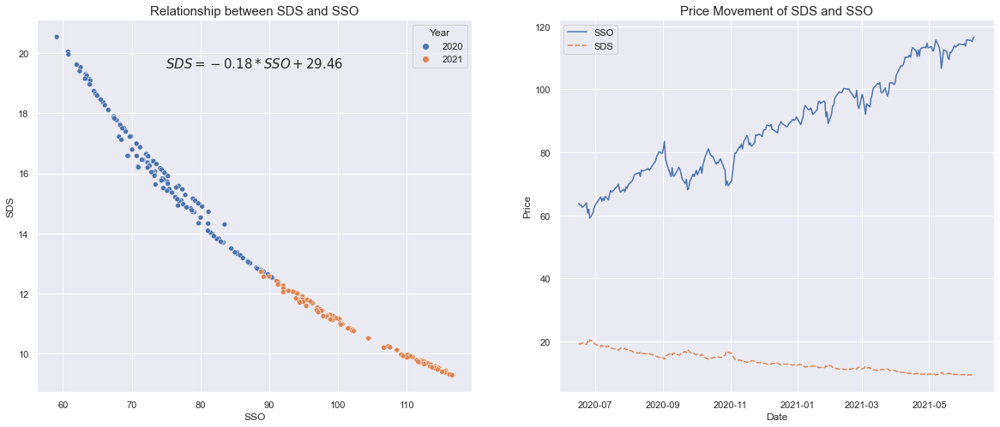

12. Relationship between SDS(-2x) and SPXU(-3x)


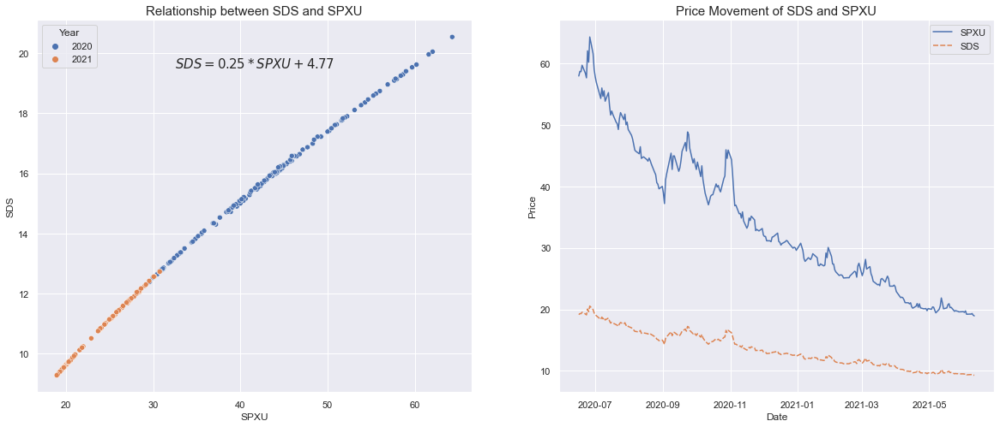

13. Relationship between UPRO(3x) and SSO(2x)


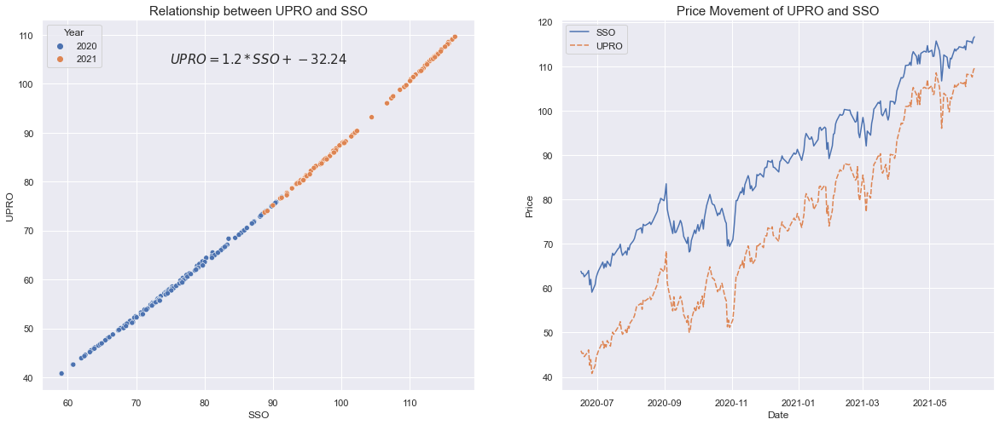

14. Relationship between UPRO(3x) and SPXU(-3x)


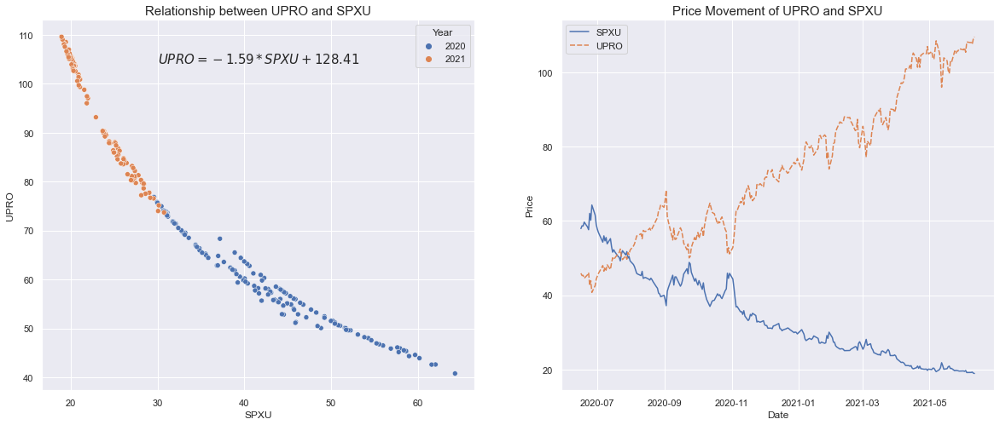

15. Relationship between SSO(2x) and SPXU(-3x)


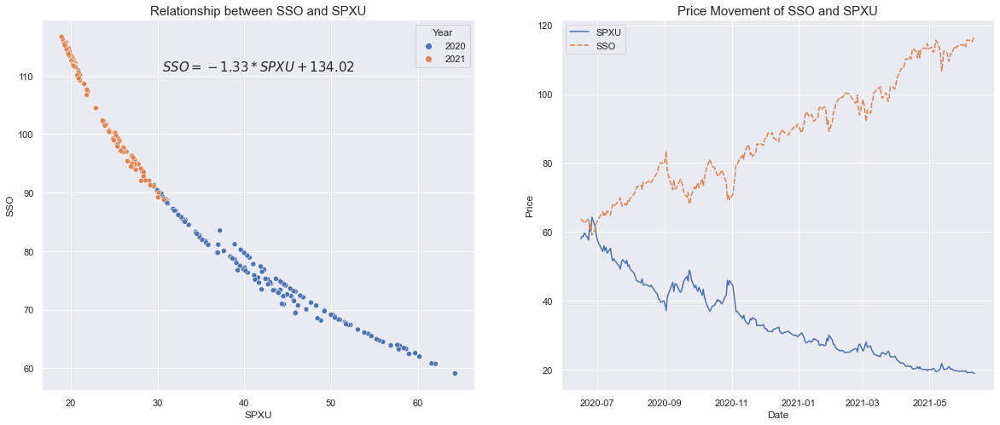

In [250]:
period = 250 # Number of samples to plot
for i, (x_ticker, y_ticker) in enumerate(itertools.combinations(TICKERS, 2)):
    print("{}. Relationship between {}({}) and {}({})".format(i + 1, x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
    data_pair, slope, constant = plot(x_ticker, y_ticker, period)

### Scatter plot, price movement, and residual plot between two ETFs

Relationship between SH(-1x) and SPXU(-3x)


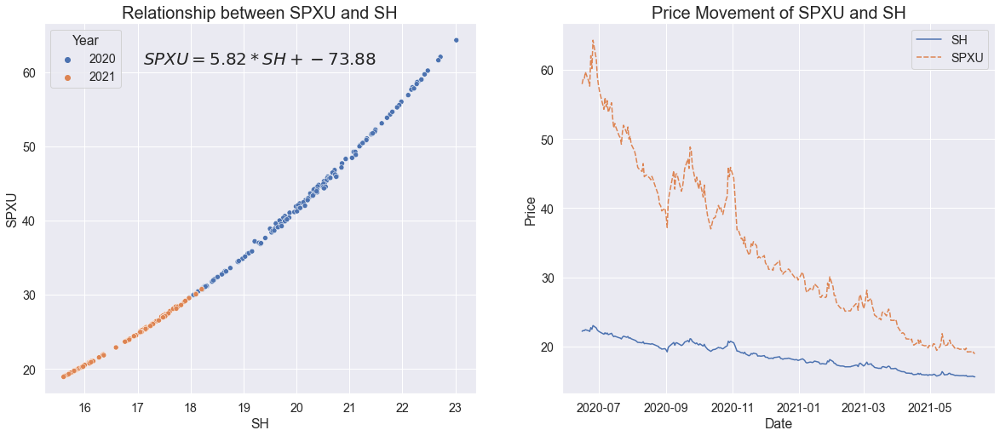

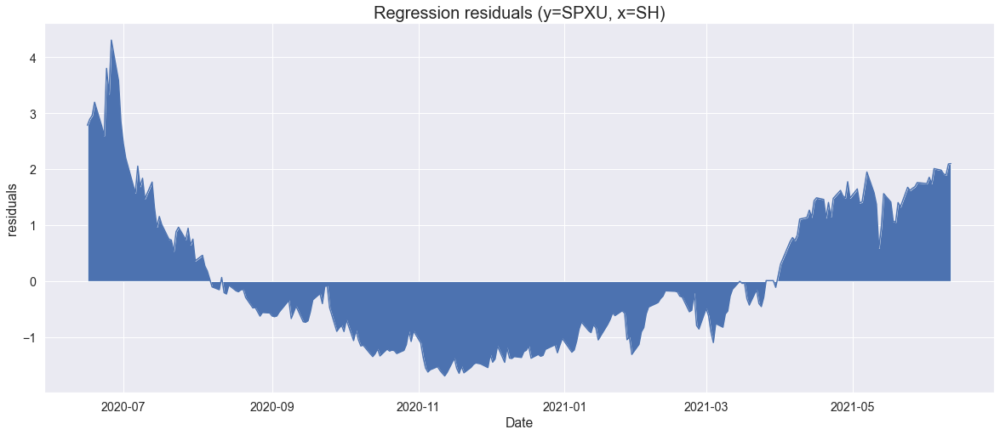

In [329]:
x_ticker, y_ticker = "SH", "SPXU"
period = 250

print("Relationship between {}({}) and {}({})".format(x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
data_pair, slope, constant = plot(y_ticker, x_ticker, period=period)
pred_y = constant + slope * data_pair[x_ticker]

data_pair["residuals"] = data_pair[y_ticker] - pred_y
plt.figure(figsize=(20,8))
plt.title("Regression residuals (y={}, x={})".format(y_ticker, x_ticker), fontsize=20)
sns.lineplot(data=data_pair["residuals"])
plt.fill_between(data_pair.index, data_pair["residuals"])
plt.show()

In [330]:
RES_NUM = 6
LOOK_BACK_WINDOW = 10
data_pair["pnl_abs"] = data_pair["residuals"].shift(-LOOK_BACK_WINDOW) - data_pair["residuals"]  # forward pnl
data_pair['residual_bucket'] = pd.cut(data_pair['residuals'], RES_NUM, labels = False)


Average 10 day pnl for 6 bucket:
residual_bucket
0    0.109290
1    0.012660
2   -0.051756
3   -0.196732
4   -0.944234
5   -2.162295
Name: pnl_abs, dtype: float64/n


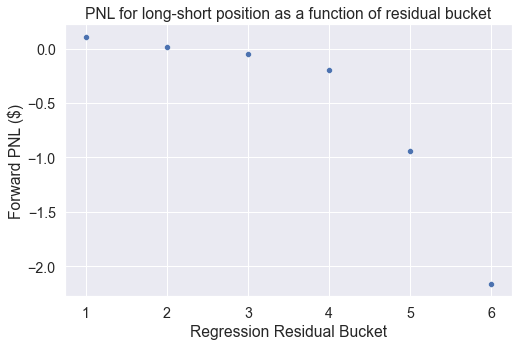

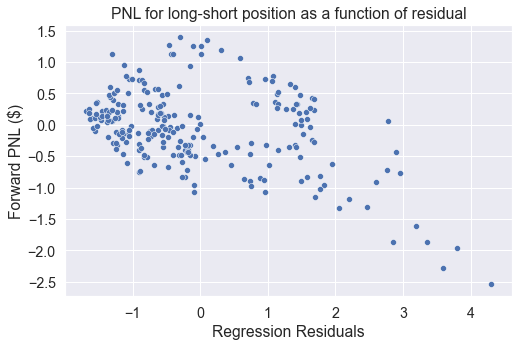

In [331]:
# residual_bucket vs avg_pnl
mapping = data_pair.groupby(["residual_bucket"])["pnl_abs"].mean()
print("Average {} day pnl for {} bucket:".format(LOOK_BACK_WINDOW, RES_NUM))
print("{}/n".format(mapping))
data_pair = data_pair.assign(avg_pnl = data_pair.residual_bucket.map(mapping))

sns.scatterplot(x = np.arange(RES_NUM) + 1, y = mapping)
# plt.scatter(df.residual_bucket,df.avg_pnl)
plt.xlabel("Regression Residual Bucket")
plt.ylabel("Forward PNL ($)")
plt.title("PNL for long-short position as a function of residual bucket")
plt.show()

sns.scatterplot(x = data_pair["residuals"], y = data_pair["pnl_abs"])
plt.xlabel("Regression Residuals")
plt.ylabel("Forward PNL ($)")
plt.title("PNL for long-short position as a function of residual")
plt.show()

## Data Exploration - intraday level 1 data version

In [257]:
filepath = os.listdir("cleaned_csv")
all_data = []

for path in filepath:
    df_temp = pd.read_csv(os.path.join("cleaned_csv", path))
    if not len(all_data):
        all_data = df_temp
    else:
        all_data = pd.concat([all_data, df_temp])
all_data.time=pd.to_datetime(all_data.time)
all_data = all_data.reset_index(drop=True)

In [258]:
all_data.head()

,time,bid1,bid_size1,ask1,ask_size1,bid2,bid_size2,ask2,ask_size2,bid3,...,mid2,imb2,mid3,imb3,mid4,imb4,mid5,imb5,mid6,imb6
0,2021-06-24 11:47:59.360497+08:00,425.04,25,425.05,31,15.5,5698,15.51,5327,9.18,...,15.505,0.516825,9.185,0.563814,111.025,0.024390,117.645,0.333333,18.615,0.896694
1,2021-06-24 11:48:09.373879+08:00,425.01,106,425.02,3,15.5,3985,15.51,3052,9.18,...,15.505,0.566292,9.185,0.657604,111.005,0.235294,117.625,0.950820,18.625,0.605873
2,2021-06-24 11:48:19.391372+08:00,425.03,30,425.04,18,15.5,5864,15.51,4777,9.18,...,15.505,0.551076,9.185,0.583547,111.005,0.235294,117.635,0.666667,18.625,0.293307
3,2021-06-24 11:48:19.391372+08:00,425.03,30,425.04,18,15.5,5864,15.51,4777,9.18,...,15.505,0.551076,9.185,0.583547,111.020,0.432432,117.635,0.666667,18.625,0.293307
4,2021-06-24 11:48:29.409515+08:00,425.06,31,425.07,21,15.5,4450,15.51,6572,9.18,...,15.505,0.403738,9.185,0.512652,111.040,0.769784,117.650,0.923077,18.615,0.610390


In [339]:
def plot_multiple(df, i, j, period=None):
    """ 
    Usage: To do a linear regression of y=SPY on x=SH, call `plot("SPY", "SH")`
    This function plots two graph about the relationship between two tickers, and do OLS with them.
        plot 1: The scatter plot of two etf prices
        plot 2: The lineplot of two etf prices over time
    Arguments:
        y_ticker: ticker of the etf to be the dependent variable
        x_ticker: ticker of the etf to be the independent variable
        period (day): If given, use the last `period` number of closed price 
                    If not given, use all the data since both tickers are traded
    """

    x_ticker, y_ticker = TICKERS[i], TICKERS[j]
    data_pair = pd.DataFrame()
    data_pair["{}_bid".format(x_ticker)], data_pair["{}_bid".format(y_ticker)] = \
        df["bid{}".format(i + 1)], df["bid{}".format(j + 1)]
    data_pair["{}_ask".format(x_ticker)], data_pair["{}_ask".format(y_ticker)] = \
        df["ask{}".format(i + 1)], df["ask{}".format(j + 1)]
    data_pair["{}_mid".format(x_ticker)], data_pair["{}_mid".format(y_ticker)] = \
        df["mid{}".format(i + 1)], df["mid{}".format(j + 1)]
    data_pair["{}_imb".format(x_ticker)], data_pair["{}_imb".format(y_ticker)] = \
        df["imb{}".format(i + 1)], df["imb{}".format(j + 1)]
    
    x_mid, y_mid = data_pair["{}_mid".format(x_ticker)], data_pair["{}_mid".format(y_ticker)]
    x, y = x_mid, y_mid
    
    data_pair["time"] = df.time
    data_pair["date_hour"] = list(map(lambda x: x.strftime("%m%d-%H"), df.time))
    
    plt.figure(figsize=(20,8))
    plt.subplot(1,2,1)
    plt.title("Relationship between {} and {}".format(y_ticker, x_ticker), fontsize=20)
    sns.scatterplot(data=data_pair, x="{}_mid".format(x_ticker), y="{}_mid".format(y_ticker), hue="date_hour", palette="Greens")
    
    x = sm.add_constant(x)
    model = sm.OLS(y, x)
    result = model.fit()
    constant = result.params[0]
    slope = result.params[1]
    plt.text((max(x_mid) + min(x_mid)) / 2, 
             max(y_mid), r'${}={}*{} + {}$'.format(y_ticker, round(slope, 2), x_ticker, round(constant, 2)), fontsize=20, ha='center')
    plt.plot(x_mid, slope * x_mid + constant, linestyle='-', c="red")

    plt.subplot(1,2,2)
    plt.title("Price Movement of {} and {}".format(y_ticker, x_ticker), fontsize=20)
    sns.lineplot(data=data_pair[["{}_mid".format(x_ticker), "{}_mid".format(y_ticker)]])
    plt.ylabel("Price")
    plt.show()
    plt.close()
    
    return data_pair, slope, constant

In [466]:
# data_pair, slope, constant = plot_multiple(all_data, 0, 1, period=None)

#### Theoretical Slope formula
Let  
ETF X: leverage m of SPY, price p_x  
ETF Y: leverage n of SPY, price p_y  
 
$$ n * \frac{\Delta p_x}{p_x} = m * \frac{\Delta p_y}{p_y} $$ 
$$ => {\Delta p_y} = \frac{n}{m} * \frac{p_y}{p_x} * \Delta p_x $$
Hence, $$ theoretical\_slope = \frac{n}{m} * \frac{p_y}{p_x} $$

In [138]:
def get_theoretical_slope(df, i, j):
    x_ticker, y_ticker = TICKERS[x_idx], TICKERS[y_idx]
    x, y = df["mid{}".format(i + 1)], df["mid{}".format(j + 1)]
    
    p_yticker_avg, p_xticker_avg = np.mean(y), np.mean(x)
    x_leverage, y_leverage = int(LEVERAGES[x_ticker][:-1]), int(LEVERAGES[y_ticker][:-1])
    
    return (p_yticker_avg / p_xticker_avg) * (y_leverage / x_leverage)
    

1. Relationship between SPY(1x) and SH(-1x)
Theoretical slope: -0.0364


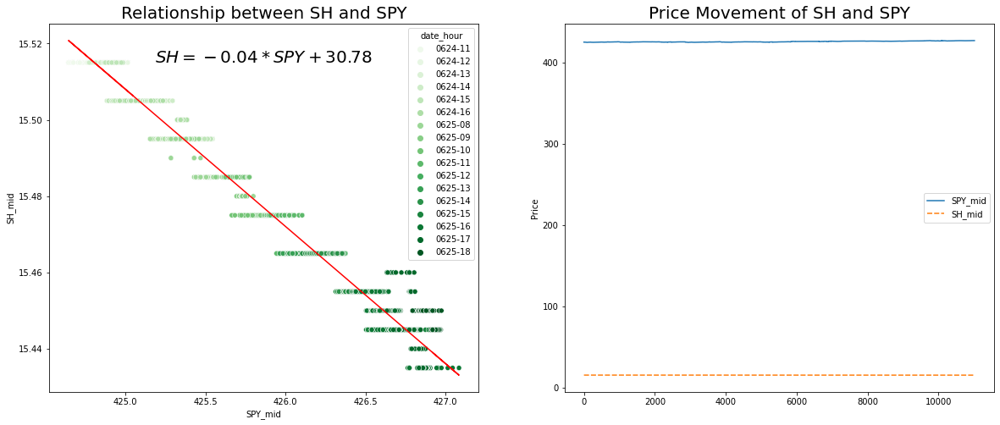

2. Relationship between SPY(1x) and SDS(-2x)
Theoretical slope: -0.043


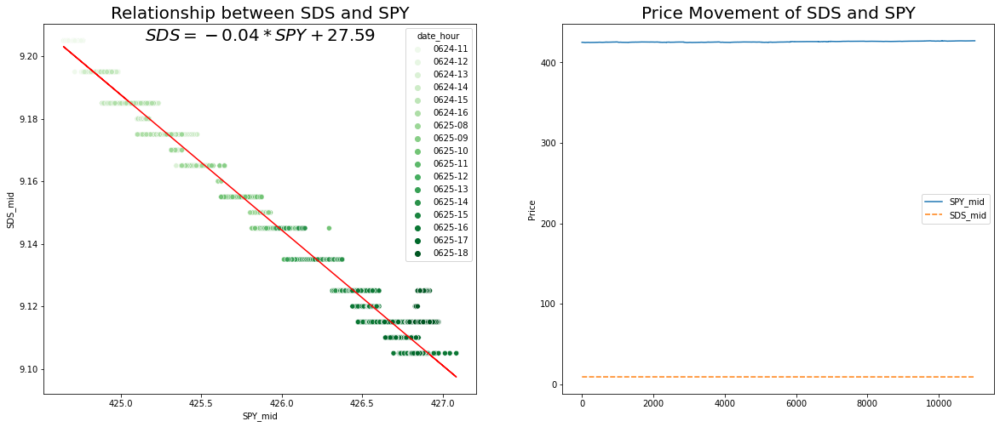

3. Relationship between SPY(1x) and UPRO(3x)
Theoretical slope: 0.786


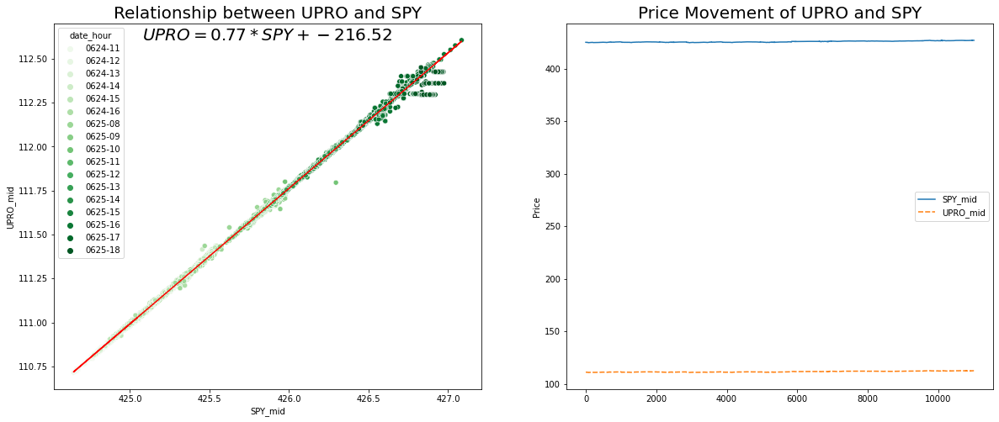

4. Relationship between SPY(1x) and SSO(2x)
Theoretical slope: 0.5544


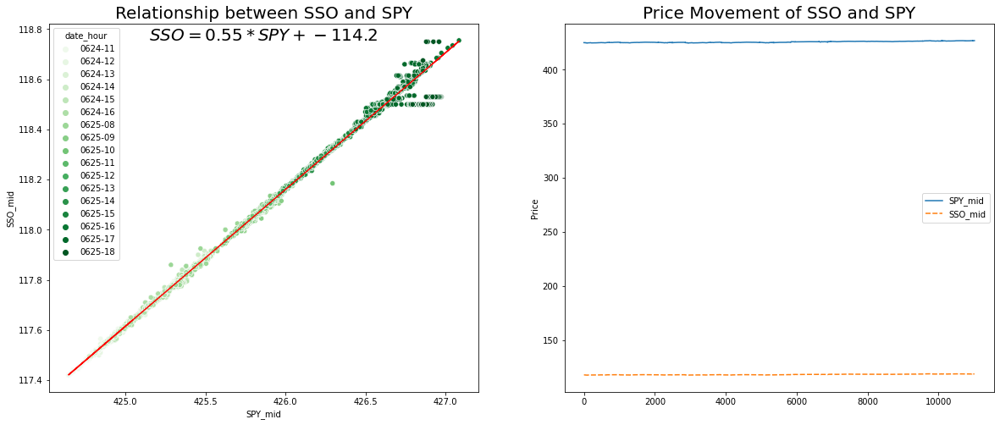

5. Relationship between SPY(1x) and SPXU(-3x)
Theoretical slope: -0.1306


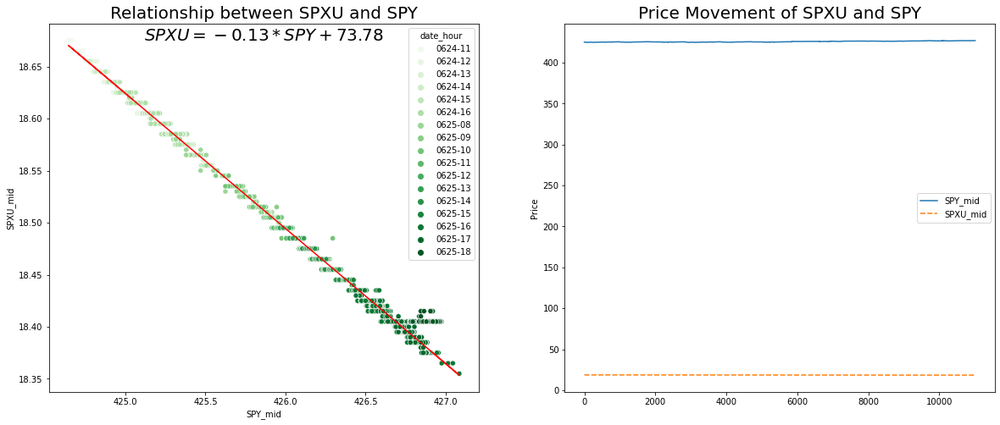

6. Relationship between SH(-1x) and SDS(-2x)
Theoretical slope: 1.1829


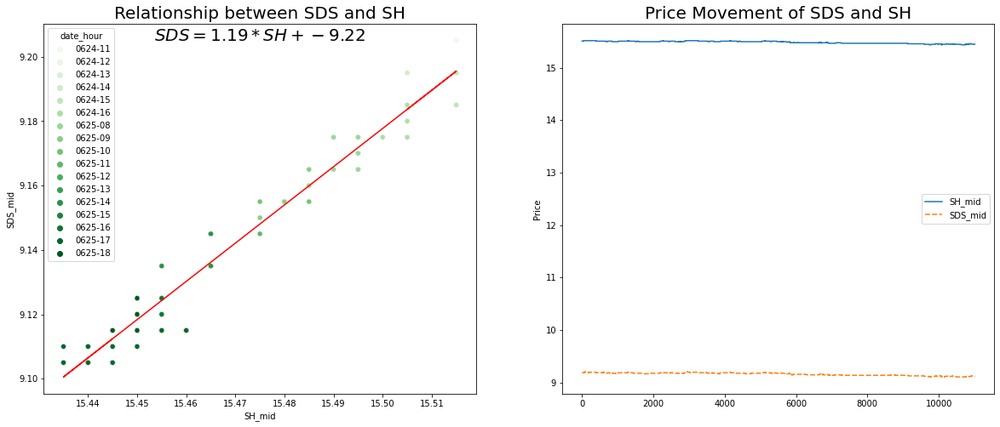

7. Relationship between SH(-1x) and UPRO(3x)
Theoretical slope: -21.6091


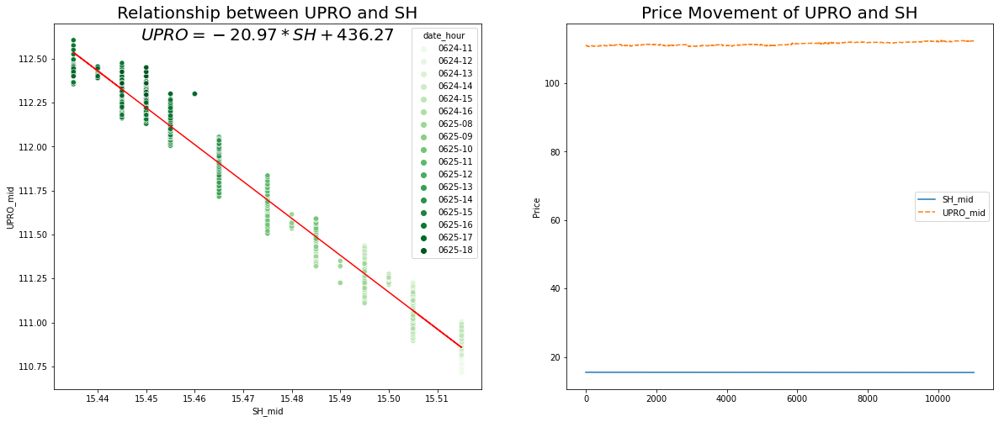

8. Relationship between SH(-1x) and SSO(2x)
Theoretical slope: -15.2414


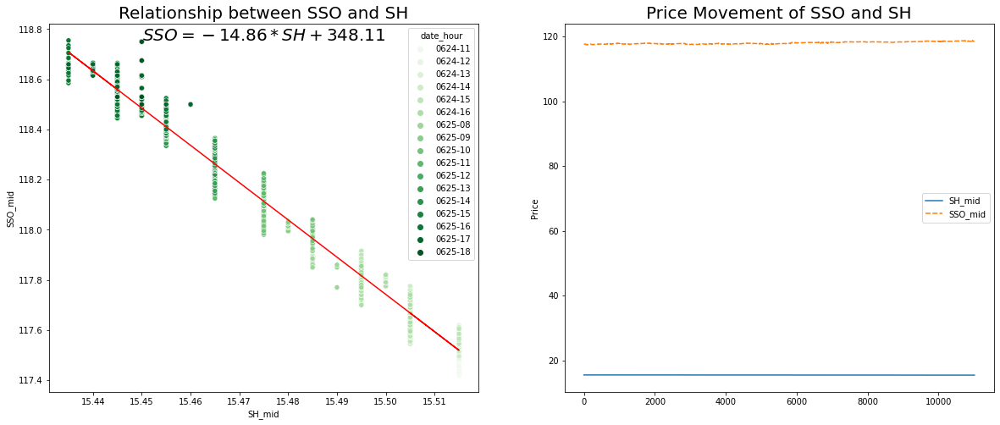

9. Relationship between SH(-1x) and SPXU(-3x)
Theoretical slope: 3.5912


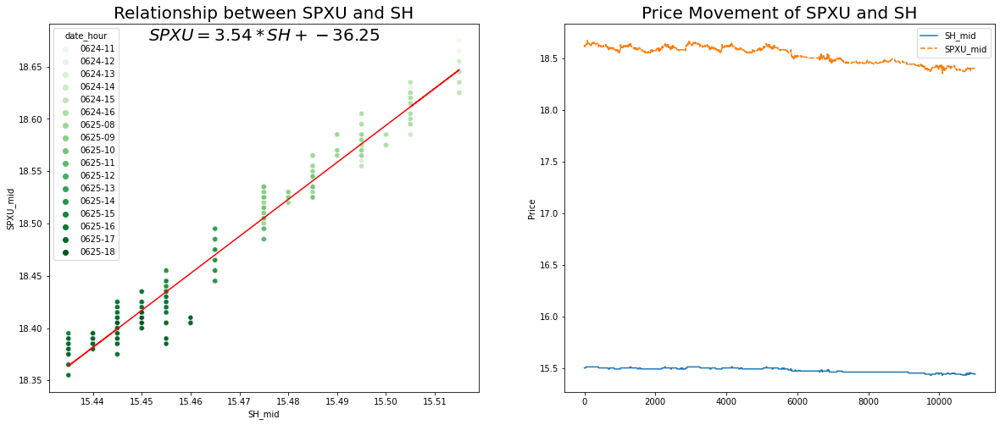

10. Relationship between SDS(-2x) and UPRO(3x)
Theoretical slope: -18.2674


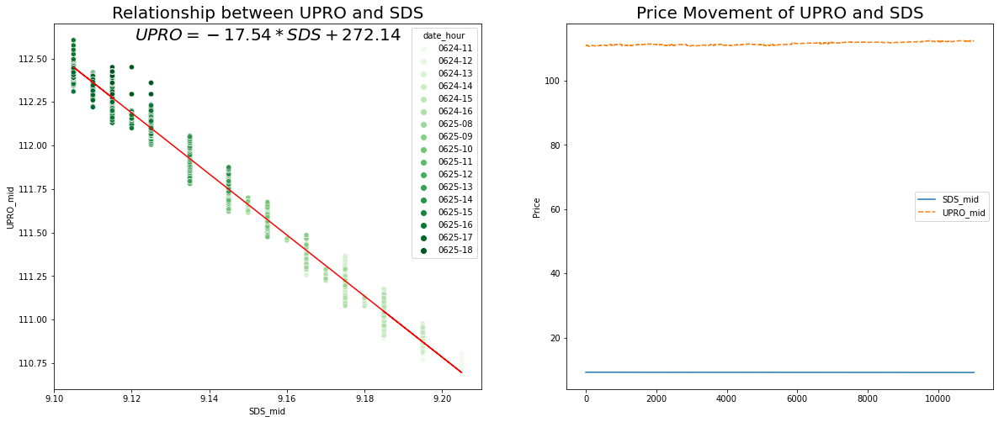

11. Relationship between SDS(-2x) and SSO(2x)
Theoretical slope: -12.8845


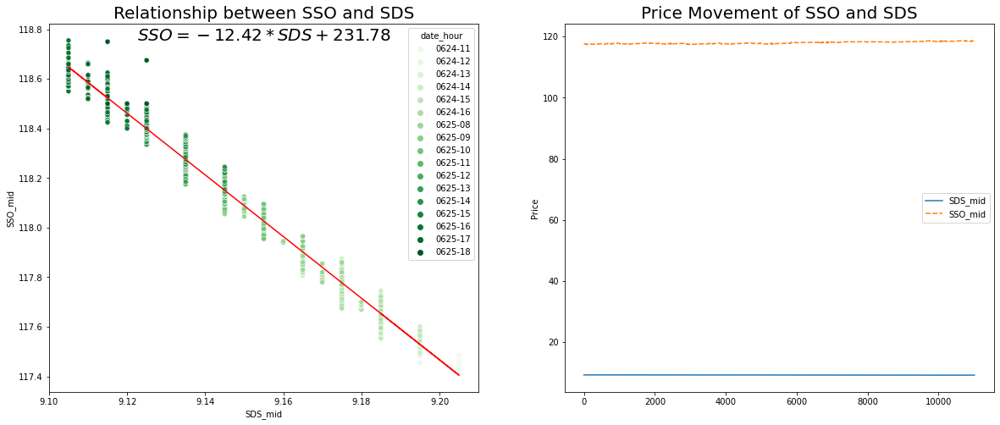

12. Relationship between SDS(-2x) and SPXU(-3x)
Theoretical slope: 3.0358


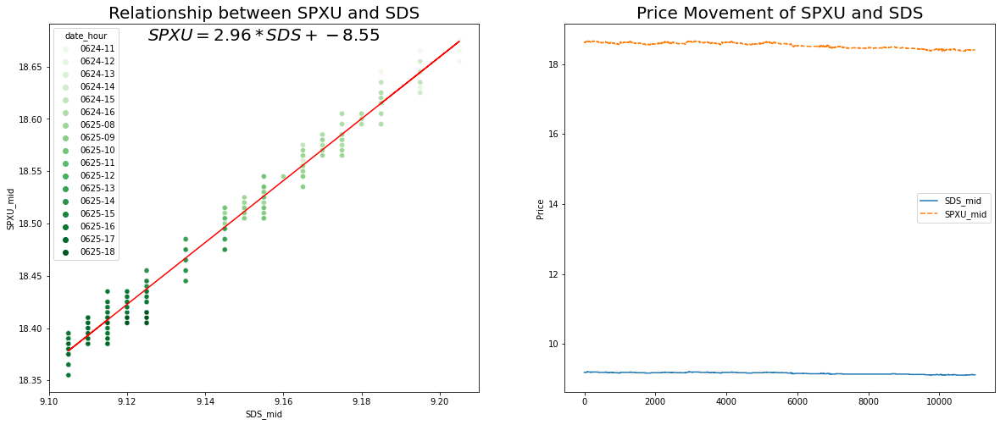

13. Relationship between UPRO(3x) and SSO(2x)
Theoretical slope: 0.7053


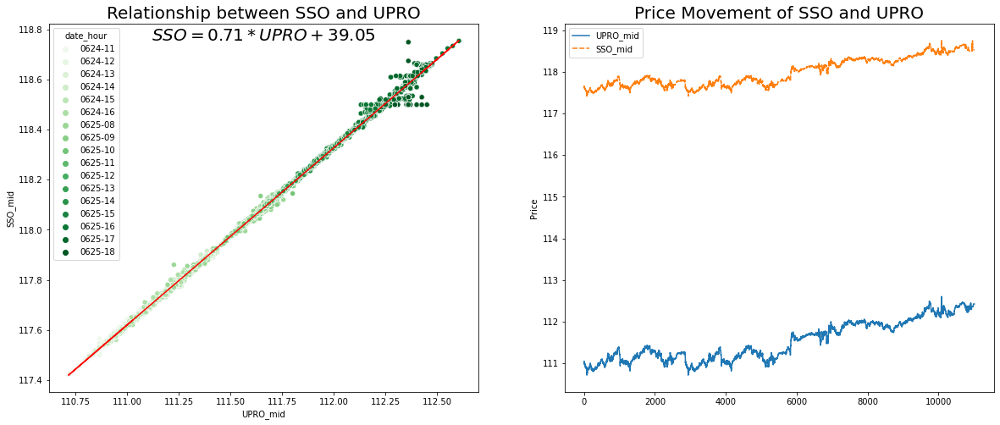

14. Relationship between UPRO(3x) and SPXU(-3x)
Theoretical slope: -0.1662


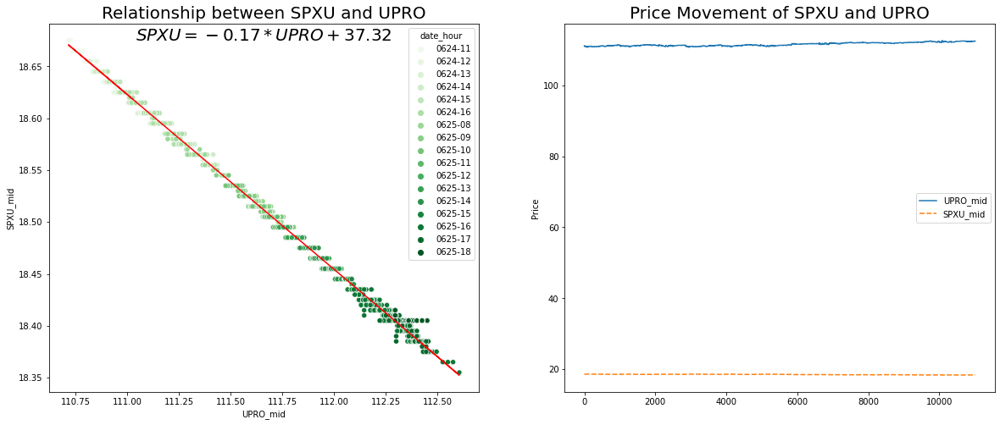

15. Relationship between SSO(2x) and SPXU(-3x)
Theoretical slope: -0.2356


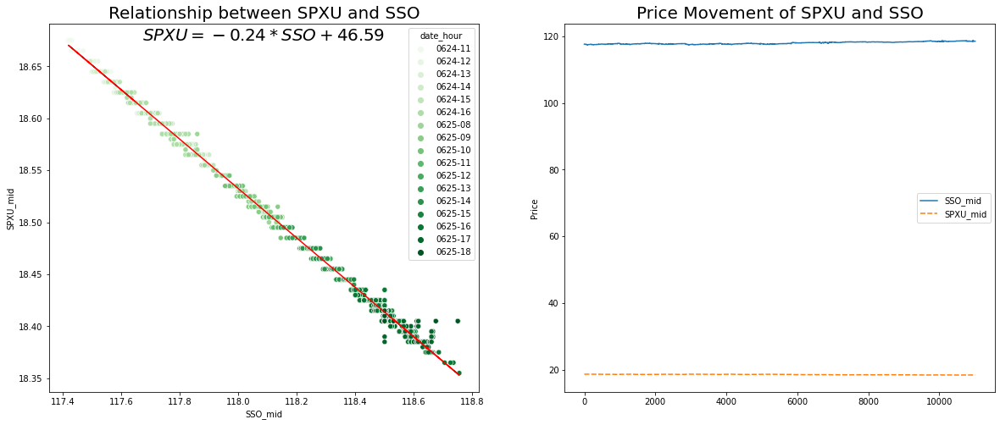

In [341]:
for i, (x_idx, y_idx) in enumerate(itertools.combinations(range(6), 2)):
    x_ticker, y_ticker = TICKERS[x_idx], TICKERS[y_idx]
    slope_theta = get_theoretical_slope(all_data, x_idx, y_idx)
    
    print("{}. Relationship between {}({}) and {}({})".format(i + 1, x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
    print("Theoretical slope: {}".format(round(slope_theta, 4)))
    data_pair, slope, constant = plot_multiple(all_data, x_idx, y_idx, period=None)
    

### Scatter plot and Residual plot between two ETFs

In [527]:
data_pair.head()

,SPY_bid,SH_bid,SPY_ask,SH_ask,SPY_mid,SH_mid,SPY_imb,SH_imb,time,date_hour,residuals
0,425.04,15.5,425.05,15.51,425.045,15.505,0.446429,0.516825,2021-06-24 11:47:59.360497+08:00,0624-11,-0.001426
1,425.01,15.5,425.02,15.51,425.015,15.505,0.972477,0.566292,2021-06-24 11:48:09.373879+08:00,0624-11,-0.002505
2,425.03,15.5,425.04,15.51,425.035,15.505,0.625000,0.551076,2021-06-24 11:48:19.391372+08:00,0624-11,-0.001786
3,425.03,15.5,425.04,15.51,425.035,15.505,0.625000,0.551076,2021-06-24 11:48:19.391372+08:00,0624-11,-0.001786
4,425.06,15.5,425.07,15.51,425.065,15.505,0.596154,0.403738,2021-06-24 11:48:29.409515+08:00,0624-11,-0.000708


In [346]:
def residual_analysis(df, x_ticker, y_ticker, lookback_window=10):
    """
    lookback_window: calculate pnl from now to `lookback_window` seconds later
    """
    x_mid_str, y_mid_str = "{}_mid".format(x_ticker), "{}_mid".format(y_ticker)
    x_imb_str, y_imb_str = "{}_imb".format(x_ticker), "{}_imb".format(y_ticker)
    
    df["residuals"] = df[y_mid_str] - pred_y
    plt.figure(figsize=(7,5))
    plt.title("Regression residuals (y={}, x={})".format(y_ticker, x_ticker), fontsize=15)
    sns.lineplot(data=df["residuals"])
    plt.axhline(y=0, c="red")
    plt.fill_between(df.index, df["residuals"])
    plt.show()
    
    df1 = df.set_index("time")
    is_duplicate = df1.index.duplicated(keep="first")
    not_duplicate = ~is_duplicate
    df1 = df1[not_duplicate]

    df2 = df1[["residuals", x_mid_str, y_mid_str, x_imb_str, y_imb_str]]
    df2.index = df2.index.shift(-lookback_window, freq='S')
    df2.columns=["residual_later", x_mid_str+"_later", y_mid_str+"_later", x_imb_str+"_later", y_imb_str+"_later"]
    df = pd.merge_asof(df1, df2, left_index=True, right_index=True, direction="forward")
    
    df['pnl_abs'] = df["residual_later"] - df["residuals"]  # forward pnl
    df['mid1_diff'] = df[x_mid_str+"_later"] - df[x_mid_str]
    df['mid2_diff'] = df[y_mid_str+"_later"] - df[y_mid_str]
    df.dropna(inplace=True)
    
    return df

In [347]:
def partition_residual(df, lookback_window=10, num_bucket=6):
    df['residual_bucket'] = pd.cut(df['residuals'], num_bucket, labels = False)
    # residual_bucket vs avg_pnl
    mapping = df.groupby(["residual_bucket"])["pnl_abs"].mean()
    print("Average {} seconds pnl for {} bucket:".format(lookback_window, num_bucket))
    print("{}/n".format(mapping))
    df = df.assign(avg_pnl = df.residual_bucket.map(mapping))
    
    plt.figure(figsize=(16,6))
    plt.subplot(1,2,1)
    plt.title("PNL for long-short position as a function of residual bucket", fontsize=16)
    sns.scatterplot(x = np.arange(num_bucket) + 1, y = mapping)
    # plt.scatter(df.residual_bucket,df.avg_pnl)
    plt.xlabel("Regression Residual Bucket")
    plt.ylabel("Forward PNL ($)")
    
    plt.subplot(1,2,2)
    plt.title("PNL for long-short position as a function of residual", fontsize=16)
    sns.scatterplot(x = df["residuals"], y = df["pnl_abs"])
    plt.xlabel("Regression Residuals")
    plt.ylabel("Forward PNL ($)")
    plt.show()
    
    return df

In [526]:
# df

In [520]:
def arbitrary_bound(df, x_ticker, y_ticker, slope, constant, lookback_window):
    x_bid, x_ask = df["{}_bid".format(x_ticker)], df["{}_ask".format(x_ticker)]
    y_bid, y_ask = df["{}_bid".format(y_ticker)], df["{}_ask".format(y_ticker)]
    x_mid, y_mid = df["{}_mid".format(x_ticker)], df["{}_mid".format(y_ticker)]
    
    x_spread, y_spread = 0.5 * (x_ask - x_bid), 0.5 * (y_ask - y_bid)
    
    plt.figure(figsize=(16,8))
    plt.title("Relationship between {} and {}".format(y_ticker, x_ticker), fontsize=20)
    sns.scatterplot(data=df, x="{}_mid".format(x_ticker), y="{}_mid".format(y_ticker), hue="date_hour", palette="Greens")
    
    plt.text((max(x_mid) + min(x_mid)) / 2, 
             max(y_mid), r'${}={}*{} + {}$'.format(y_ticker, round(slope, 2), x_ticker, round(constant, 2)), fontsize=20, ha='center')
    y_pred = slope * x_mid + constant
    plt.plot(x_mid, y_pred, linestyle='-', c="red")
    
    # Embed transaction cost:
    # Vertical direction, 
    #      i) Above -> y overpriced and x underpriced -> short 1 unit of y and long `slope` unit of x -> expected return `epsilon`
    #           Transaction cost = 1 spread of y and `slope` spread of x -> epsilon should be >= 1 * y_spread + slope * x_spread
    #      ii)Below -> y underpriced and x overpriced -> long 1 unit of y and short `slope` unit of x -> expected return `epsilon`
    #           Transaction cost = 1 spread of y and `slope` spread of x -> epsilon should be >= 1 * y_spread + slope * x_spread
    # Horizontal direction will just be the case if we flip the x y axis
    upperbound = y_pred + y_spread + slope * x_spread
    lowerbound = y_pred - y_spread + slope * x_spread
    
    plt.plot(x_mid, upperbound, c = "blue", linestyle = '--', alpha=0.5)
    plt.plot(x_mid, lowerbound, c = "blue", linestyle = '--', alpha=0.5)
    
    plt.show()
    
    y_nparray = y_mid.to_numpy()
    short_y_idx = y_mid[y_mid > upperbound].index
    long_y_idx = y_mid[y_mid < lowerbound].index
    index_arbitrage = np.concatenate((short_y_idx, long_y_idx), axis=None)
    
    num_arbitrage = len(index_arbitrage)
    exp_mean_return = np.mean(df.loc[index_arbitrage]["pnl_abs"])     # difference between residuals
    
    df2 = df[["{}_bid".format(x_ticker), "{}_bid".format(y_ticker), "{}_ask".format(x_ticker), "{}_ask".format(y_ticker)]]
    df2.index = df2.index.shift(-lookback_window, freq='S')
    df2.columns = ["{}_bid_later".format(x_ticker), "{}_bid_later".format(y_ticker), "{}_ask_later".format(x_ticker), "{}_ask_later".format(y_ticker)]
    df = pd.merge_asof(df, df2, left_index=True, right_index=True, direction="forward")

    short_y_return = df.loc[short_y_idx]["{}_bid".format(y_ticker)] - df.loc[short_y_idx]["{}_ask_later".format(y_ticker)] + \
                    slope * (- df.loc[short_y_idx]["{}_ask".format(x_ticker)] + df.loc[short_y_idx]["{}_bid_later".format(x_ticker)])
    long_y_return = -df.loc[long_y_idx]["{}_ask".format(y_ticker)] + df.loc[long_y_idx]["{}_bid_later".format(y_ticker)] + \
                    slope * (df.loc[long_y_idx]["{}_bid".format(x_ticker)] - df.loc[long_y_idx]["{}_ask_later".format(x_ticker)])
    
    act_return = pd.concat([short_y_return, long_y_return])
    act_mean_return = np.mean(act_return)
    
    pos_return = act_return[act_return > 0]
    neg_return = act_return[act_return <= 0]
    
    pos_trade = df.loc[index_arbitrage][df.loc[index_arbitrage]["pnl_abs"] > 0]
    neg_trade = df.loc[index_arbitrage][df.loc[index_arbitrage]["pnl_abs"] <= 0]
    
    print("Total number of data points: {}".format(len(df)))
    print("Number of arbitrage opportunity: {}".format(num_arbitrage))
    print("Expected Mean return of arbitrage opportunity: {}".format(round(exp_mean_return, 4)))
    print("\tPercentage of profitable arbitrage opportunity: {}%".format(100 * round( len(pos_trade)/num_arbitrage, 4)))
    print("\tPercentage of non-profitable arbitrage opportunity: {}%".format(100 * round( len(neg_trade)/num_arbitrage, 4)))
    
    print("Actual Mean return: {}".format(round(act_mean_return, 4)))
    print("\tPercentage of profitable trade: {}%".format(100 * round( len(pos_return)/num_arbitrage, 4)))
    print("\tPercentage of non-profitable trade: {}%".format(100 * round( len(neg_return)/num_arbitrage, 4)))
    

In [522]:
# arbitrary_bound(df, "SPY", "SSO", 0.5454392574209095, -114.19692180836864, 20)

Relationship between SPY(1x) and SSO(2x)


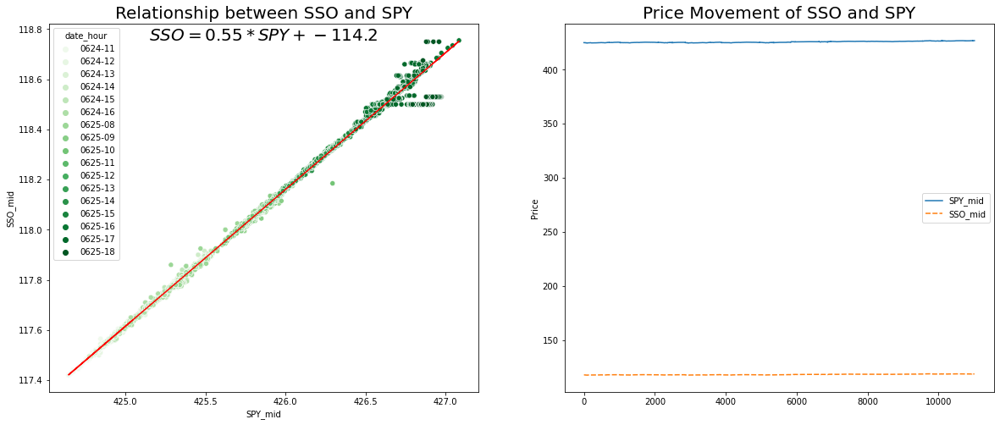

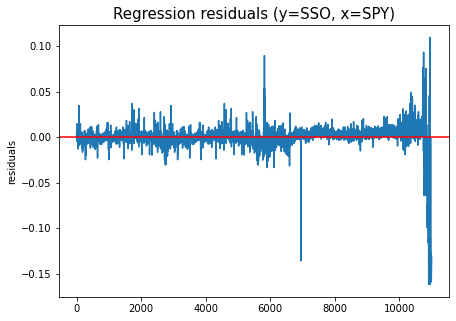

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.005673
1    0.002714
2   -0.000054
3   -0.036839
Name: pnl_abs, dtype: float64/n


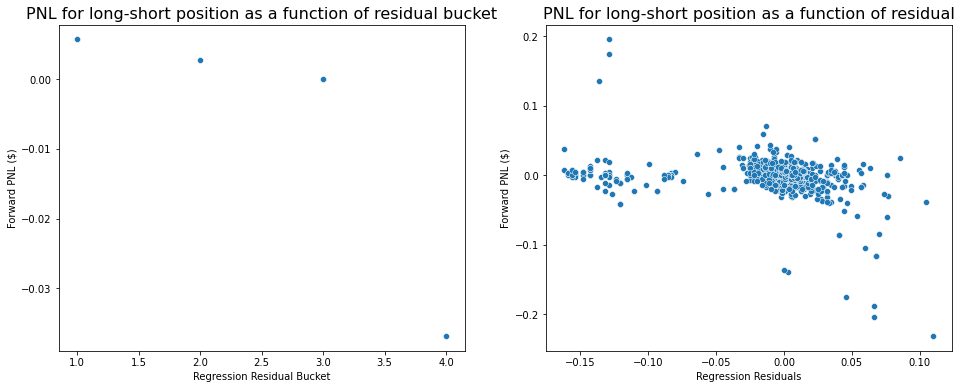

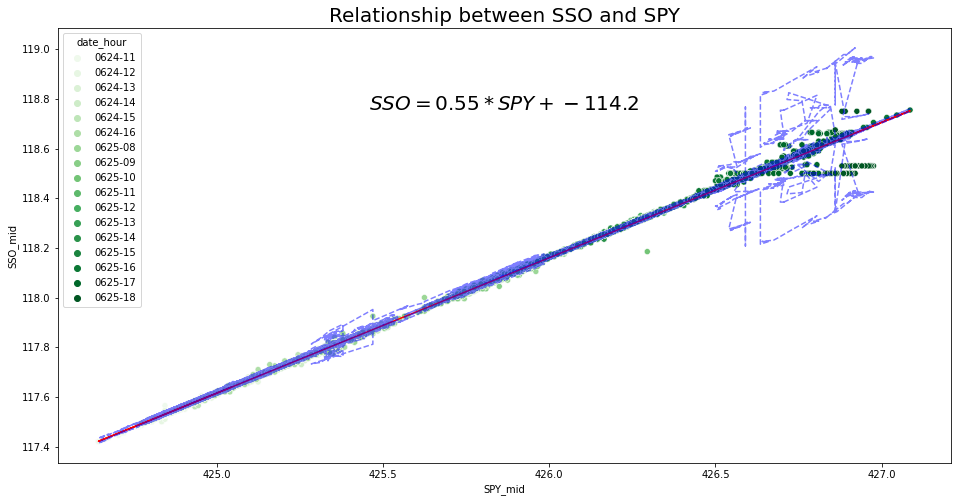

Total number of data points: 6254
Number of arbitrage opportunity: 1127
Expected Mean return of arbitrage opportunity: 0.0002
	Percentage of profitable arbitrage opportunity: 51.2%
	Percentage of non-profitable arbitrage opportunity: 48.8%
Actual Mean return: -0.0181
	Percentage of profitable trade: 1.3299999999999998%
	Percentage of non-profitable trade: 98.67%


In [524]:
x_ticker, y_ticker = "SPY", "SSO"   # "SPY", "SH", "SDS", "UPRO", "SSO", "SPXU"
x_mid_str, y_mid_str = "{}_mid".format(x_ticker), "{}_mid".format(y_ticker)

print("Relationship between {}({}) and {}({})".format(x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
data_pair, slope, constant = plot_multiple(all_data, TICKERS2INDEX[x_ticker], TICKERS2INDEX[y_ticker], period=None)
pred_y = constant + slope * data_pair[x_mid_str]

df = residual_analysis(data_pair, x_ticker, y_ticker, lookback_window=20)
df = partition_residual(df, lookback_window=20, num_bucket=4)
# print(x_ticker, y_ticker, slope, constant)
arbitrary_bound(df, x_ticker, y_ticker, slope, constant, 20)

1. Analysis of SPY(1x) and SH(-1x)
Relationship between SPY(1x) and SH(-1x)


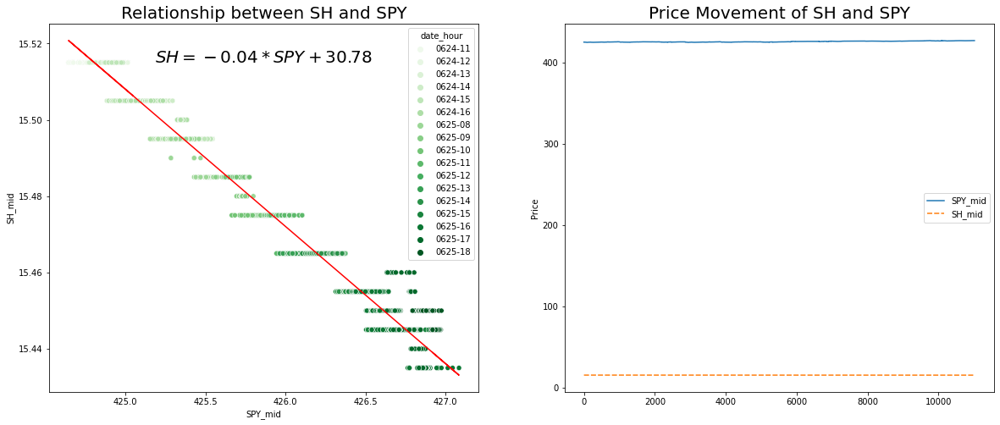

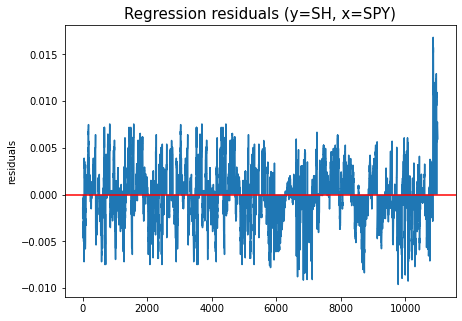

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.000578
1   -0.000054
2   -0.000782
3   -0.000497
Name: pnl_abs, dtype: float64/n


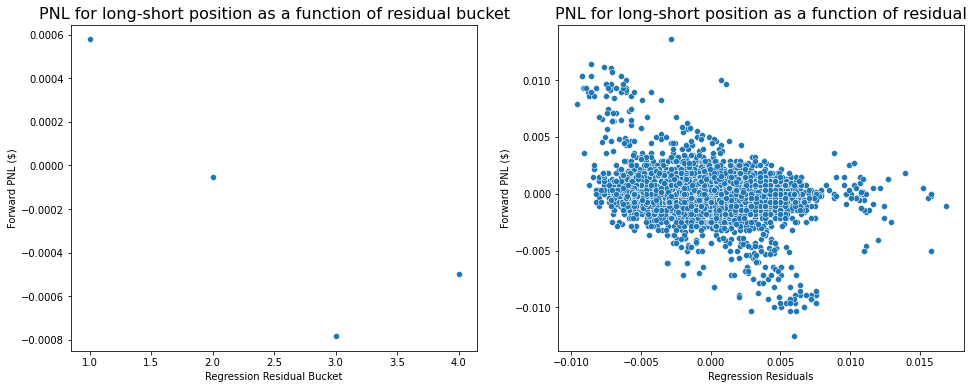

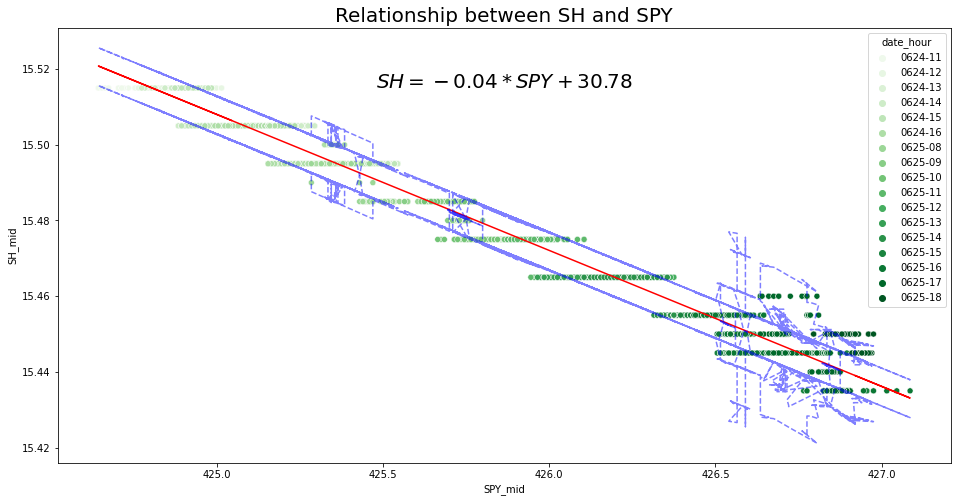

Total number of data points: 6254
Number of arbitrage opportunity: 887
Expected Mean return of arbitrage opportunity: 0.0002
	Percentage of profitable arbitrage opportunity: 43.29%
	Percentage of non-profitable arbitrage opportunity: 56.71000000000001%
Actual Mean return: -0.0075
	Percentage of profitable trade: 8.459999999999999%
	Percentage of non-profitable trade: 91.21000000000001%
2. Analysis of SPY(1x) and SH(-1x)
Relationship between SPY(1x) and SDS(-2x)


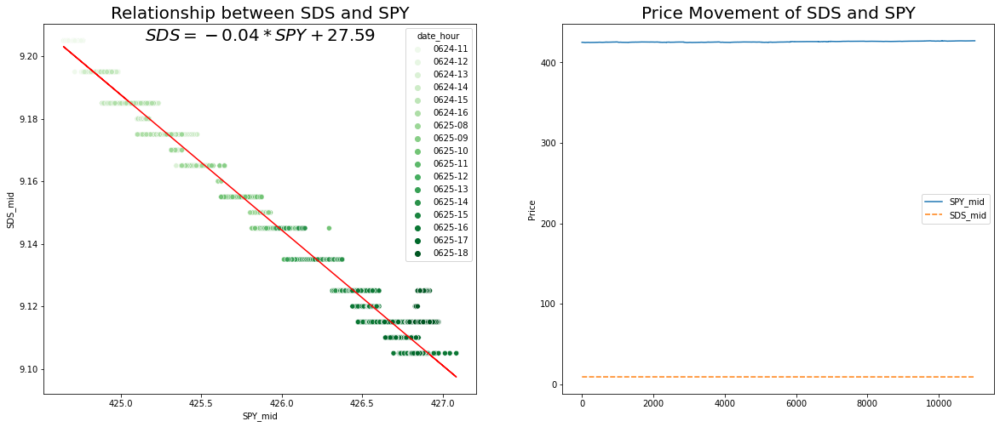

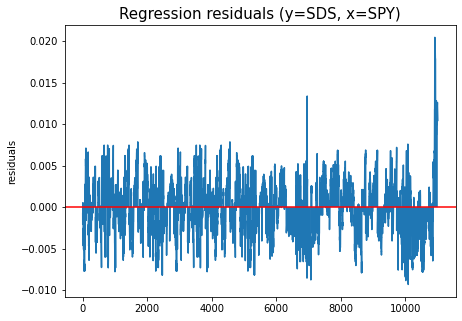

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.000584
1   -0.000176
2   -0.001884
3   -0.001132
Name: pnl_abs, dtype: float64/n


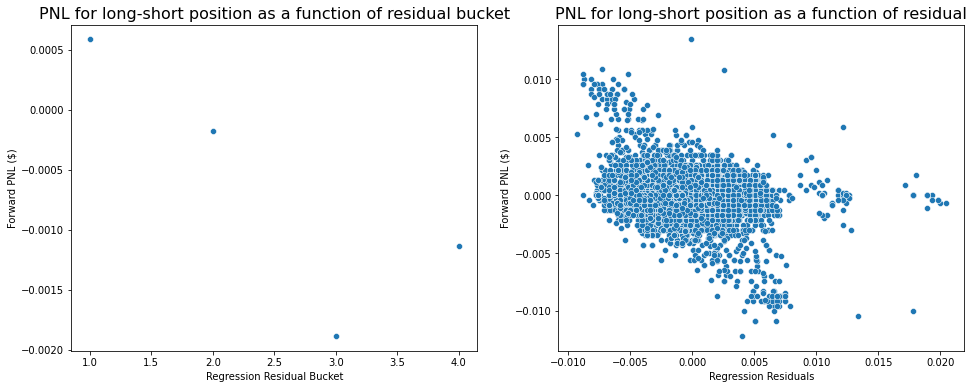

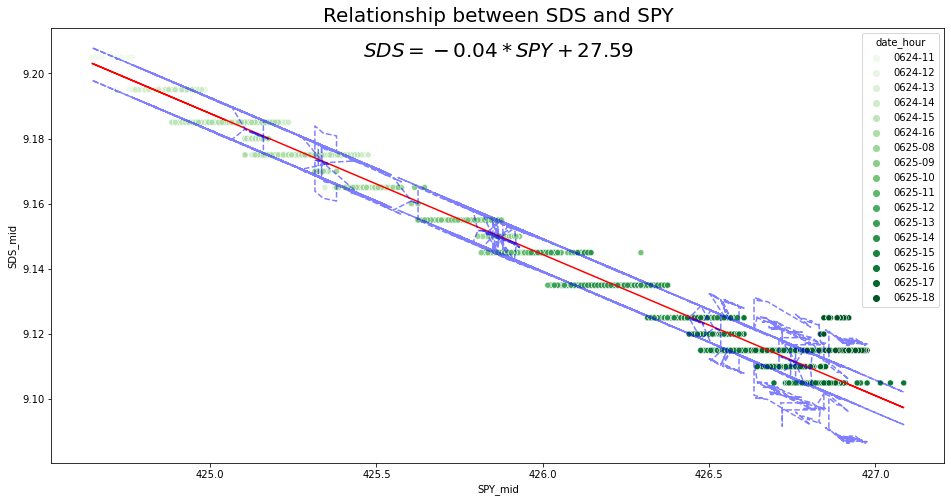

Total number of data points: 6254
Number of arbitrage opportunity: 887
Expected Mean return of arbitrage opportunity: 0.0
	Percentage of profitable arbitrage opportunity: 44.080000000000005%
	Percentage of non-profitable arbitrage opportunity: 55.92%
Actual Mean return: -0.0058
	Percentage of profitable trade: 14.879999999999999%
	Percentage of non-profitable trade: 85.11999999999999%
3. Analysis of SPY(1x) and SDS(-2x)
Relationship between SPY(1x) and UPRO(3x)


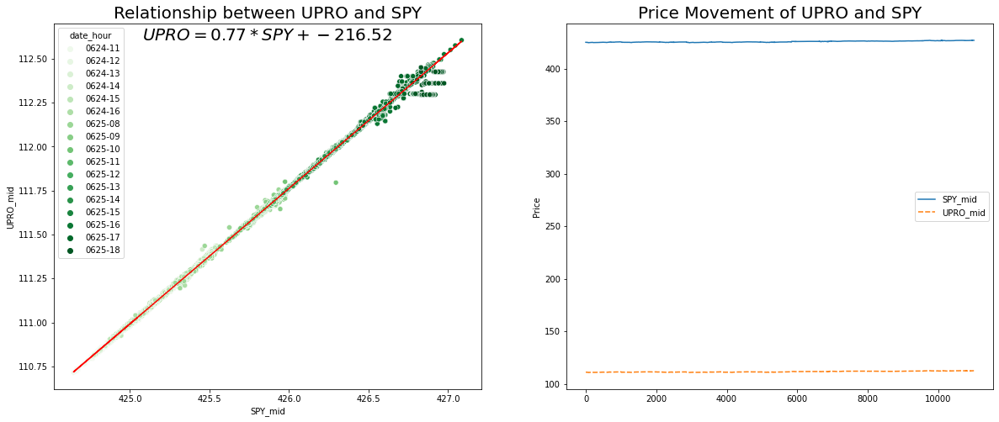

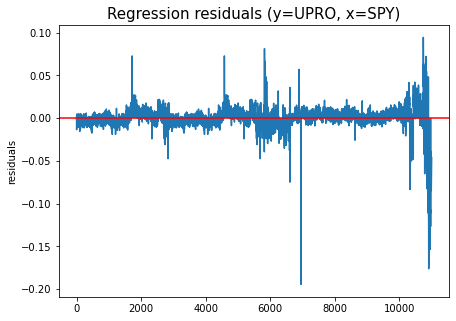

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.033753
1    0.002233
2    0.000019
3   -0.015190
Name: pnl_abs, dtype: float64/n


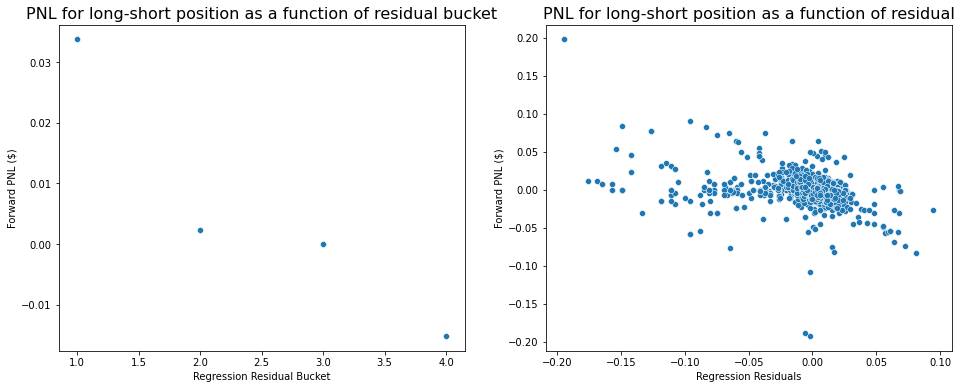

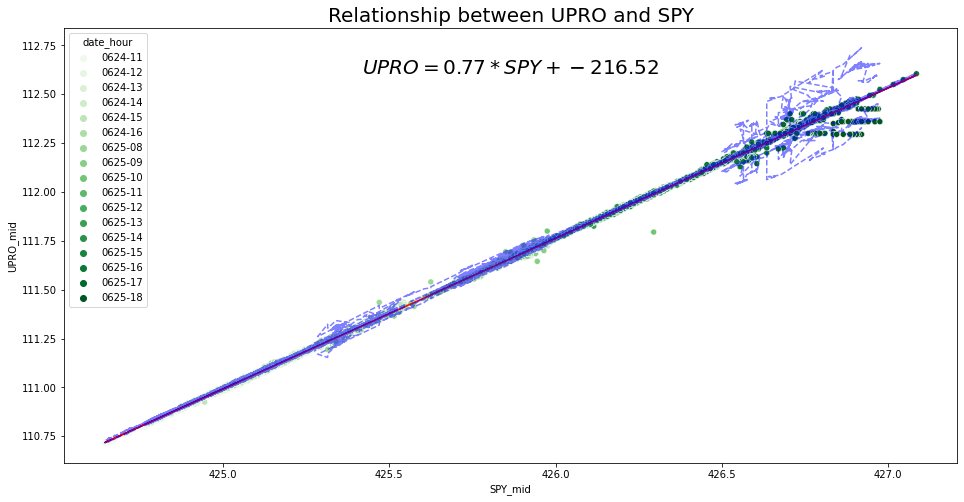

Total number of data points: 6254
Number of arbitrage opportunity: 2253
Expected Mean return of arbitrage opportunity: 0.0011
	Percentage of profitable arbitrage opportunity: 54.279999999999994%
	Percentage of non-profitable arbitrage opportunity: 45.72%
Actual Mean return: -0.0246
	Percentage of profitable trade: 0.58%
	Percentage of non-profitable trade: 99.42%
4. Analysis of SPY(1x) and UPRO(3x)
Relationship between SPY(1x) and SSO(2x)


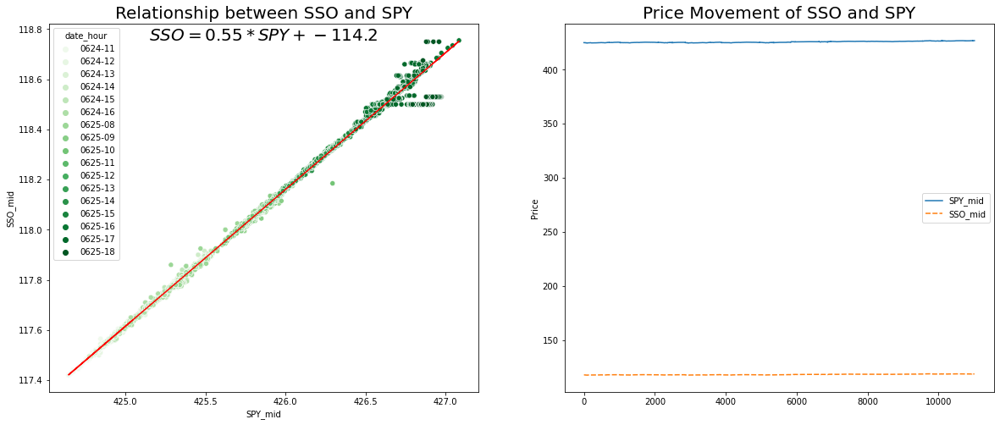

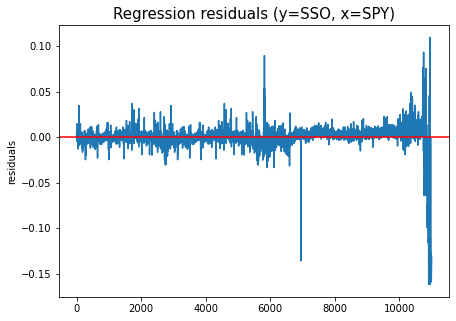

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.005673
1    0.002714
2   -0.000054
3   -0.036839
Name: pnl_abs, dtype: float64/n


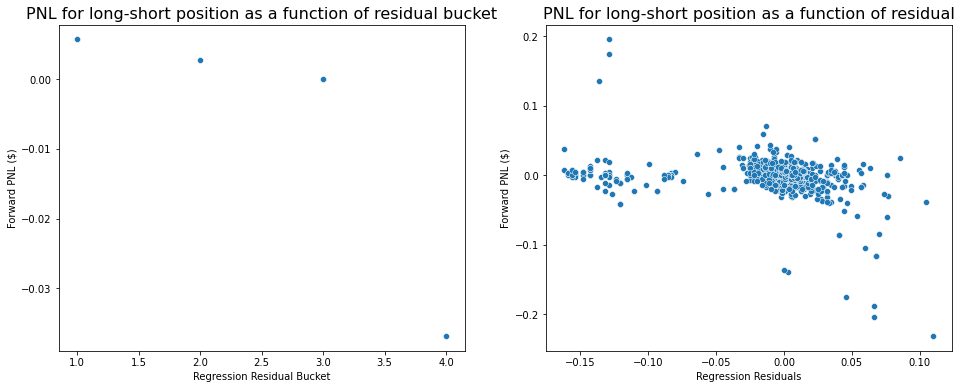

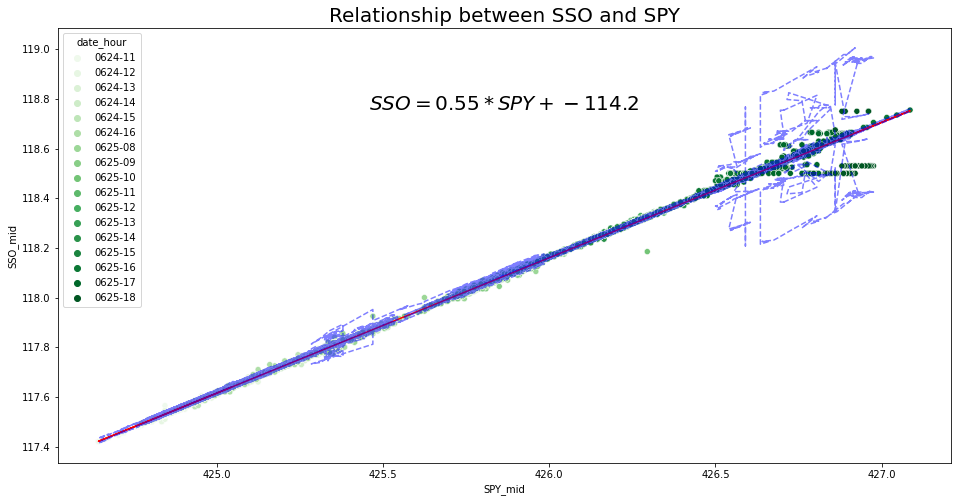

Total number of data points: 6254
Number of arbitrage opportunity: 1127
Expected Mean return of arbitrage opportunity: 0.0002
	Percentage of profitable arbitrage opportunity: 51.2%
	Percentage of non-profitable arbitrage opportunity: 48.8%
Actual Mean return: -0.0183
	Percentage of profitable trade: 1.3299999999999998%
	Percentage of non-profitable trade: 98.67%
5. Analysis of SPY(1x) and SSO(2x)
Relationship between SPY(1x) and SPXU(-3x)


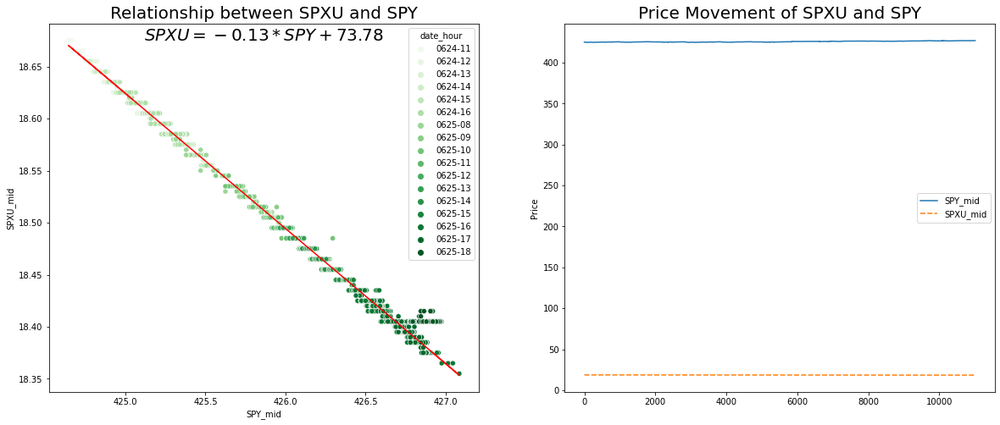

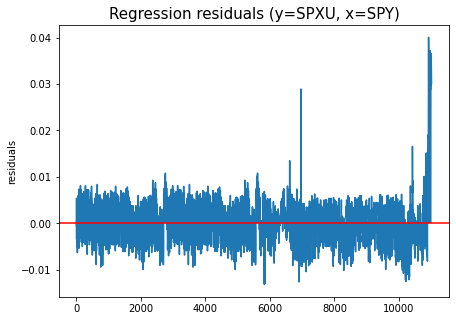

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.001543
1   -0.001998
2    0.000431
3   -0.001388
Name: pnl_abs, dtype: float64/n


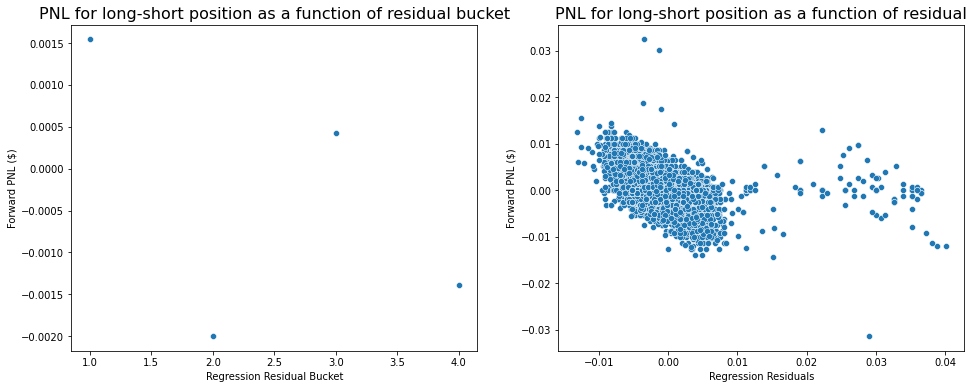

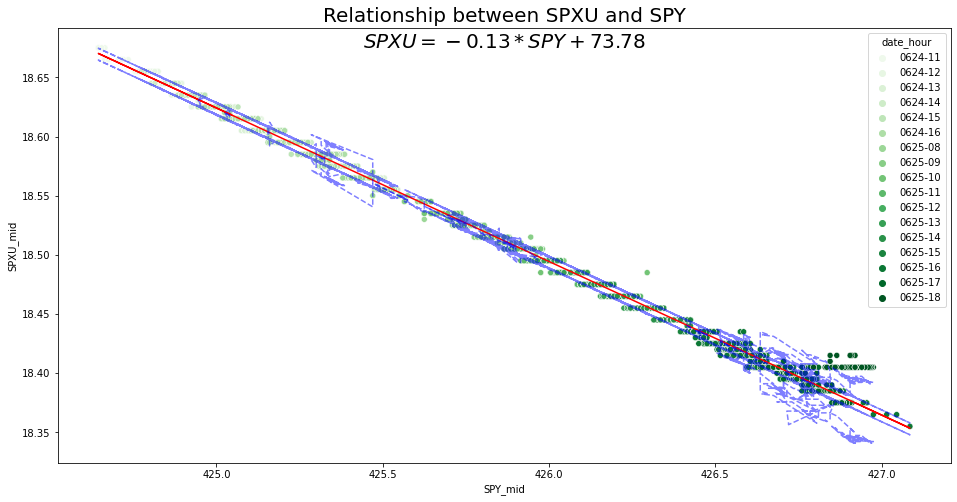

Total number of data points: 6254
Number of arbitrage opportunity: 1093
Expected Mean return of arbitrage opportunity: -0.0004
	Percentage of profitable arbitrage opportunity: 39.98%
	Percentage of non-profitable arbitrage opportunity: 60.019999999999996%
Actual Mean return: -0.0057
	Percentage of profitable trade: 16.470000000000002%
	Percentage of non-profitable trade: 83.26%
6. Analysis of SPY(1x) and SPXU(-3x)
Relationship between SH(-1x) and SDS(-2x)


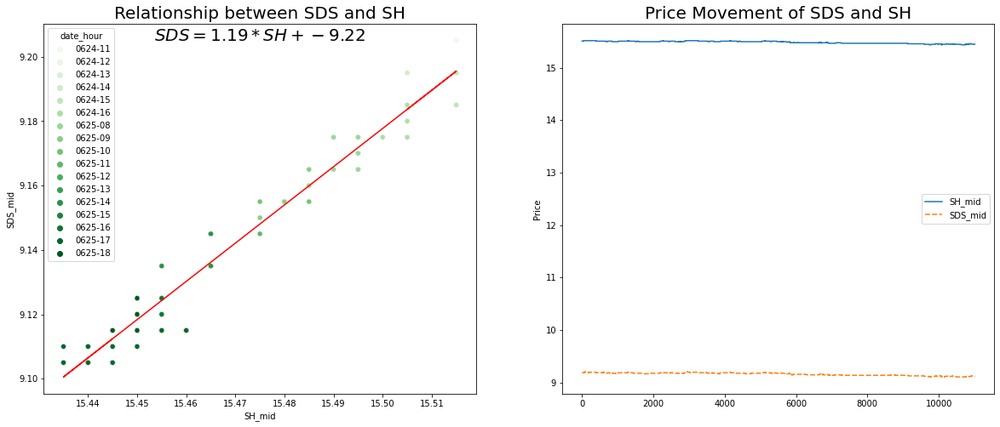

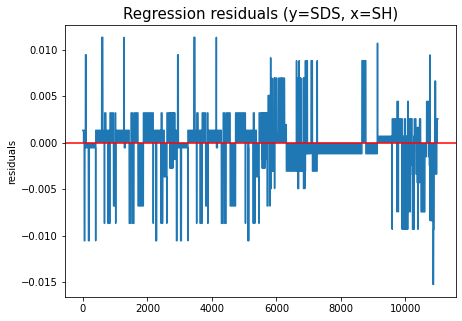

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.002695
1    0.000761
2   -0.000174
3   -0.001370
Name: pnl_abs, dtype: float64/n


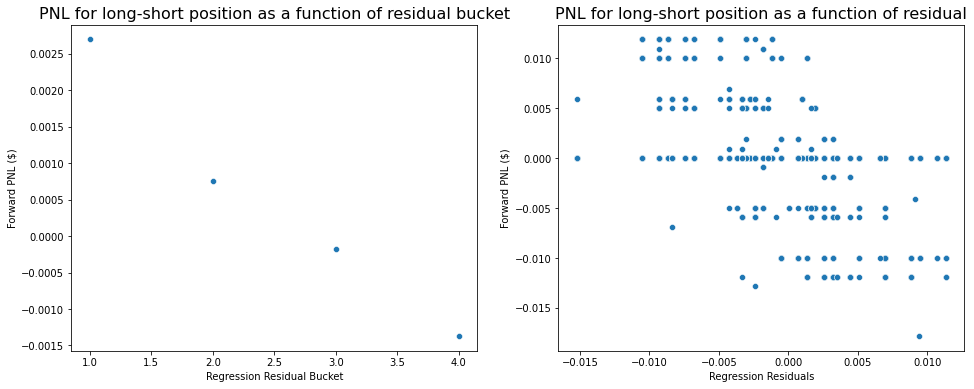

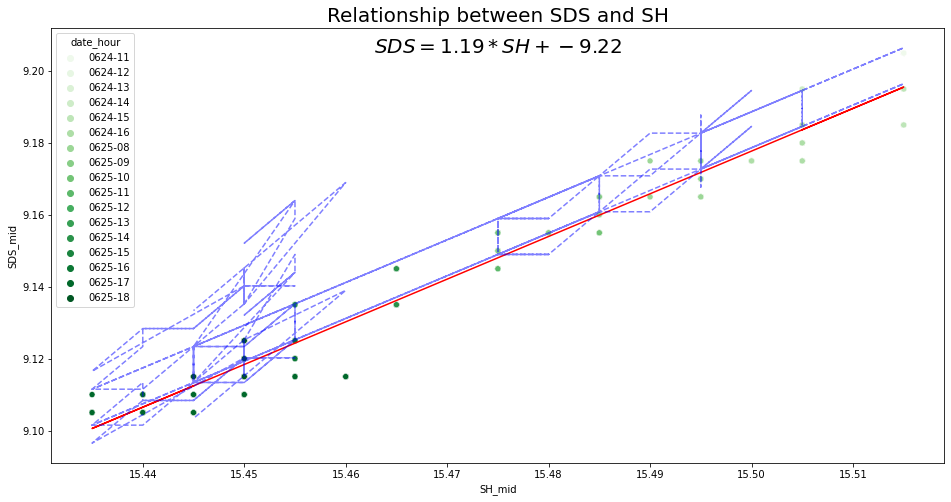

Total number of data points: 6254
Number of arbitrage opportunity: 3700
Expected Mean return of arbitrage opportunity: 0.0004
	Percentage of profitable arbitrage opportunity: 6.05%
	Percentage of non-profitable arbitrage opportunity: 93.95%
Actual Mean return: -0.0228
	Percentage of profitable trade: 0.0%
	Percentage of non-profitable trade: 100.0%
7. Analysis of SH(-1x) and SDS(-2x)
Relationship between SH(-1x) and UPRO(3x)


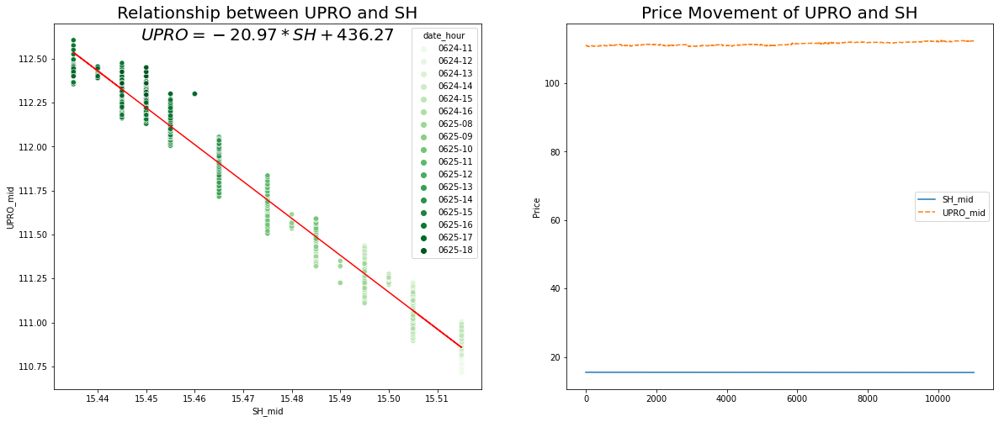

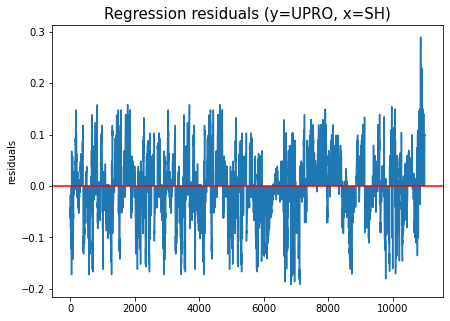

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.014632
1    0.000302
2   -0.011557
3   -0.013987
Name: pnl_abs, dtype: float64/n


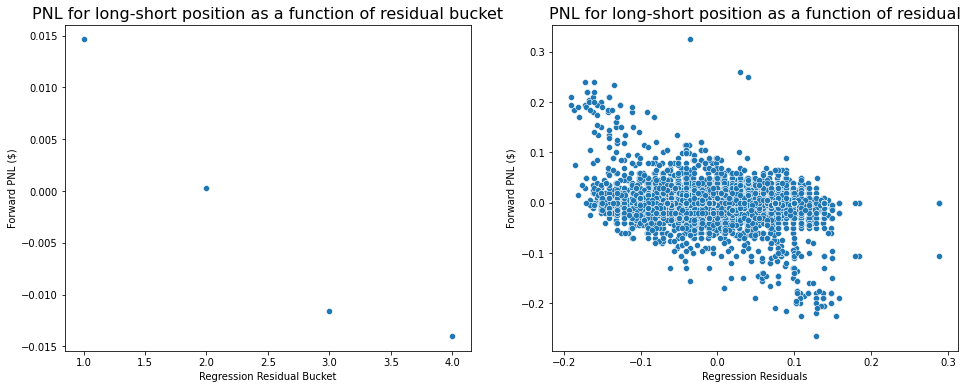

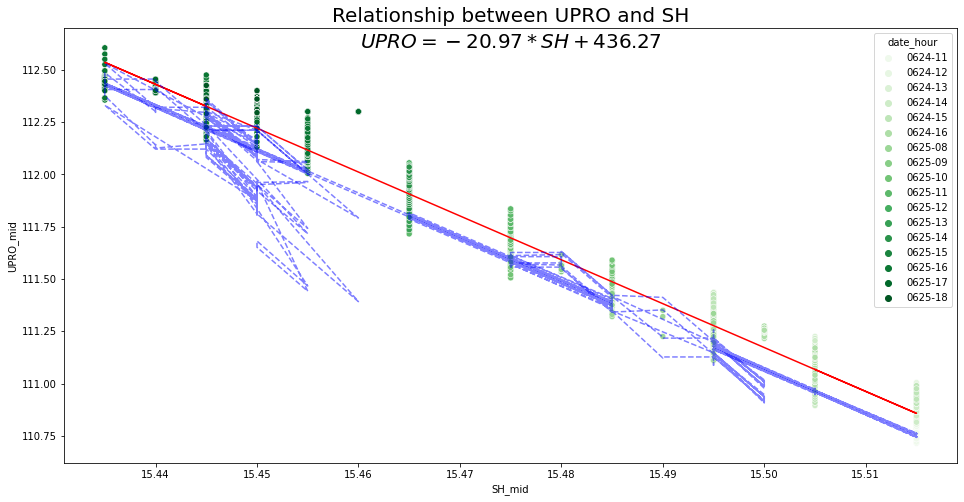

Total number of data points: 6254
Number of arbitrage opportunity: 5964
Expected Mean return of arbitrage opportunity: -0.0009
	Percentage of profitable arbitrage opportunity: 40.949999999999996%
	Percentage of non-profitable arbitrage opportunity: 59.050000000000004%
Actual Mean return: 0.2031
	Percentage of profitable trade: 99.4%
	Percentage of non-profitable trade: 0.5499999999999999%
8. Analysis of SH(-1x) and UPRO(3x)
Relationship between SH(-1x) and SSO(2x)


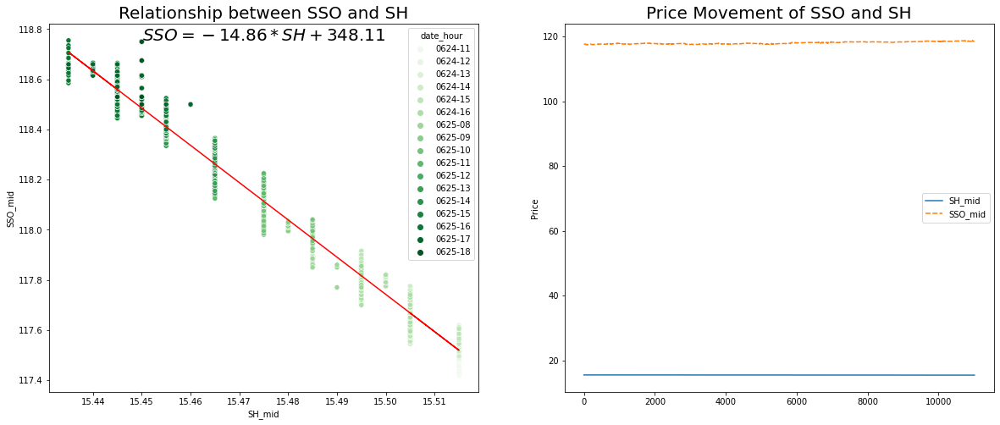

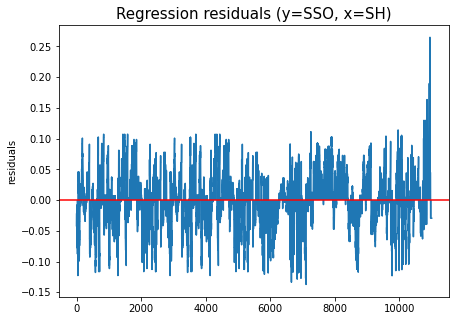

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.007865
1   -0.000948
2   -0.016659
3   -0.139167
Name: pnl_abs, dtype: float64/n


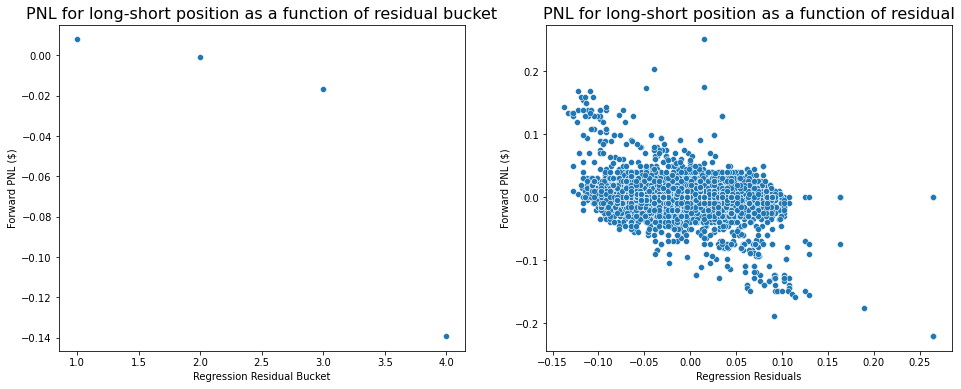

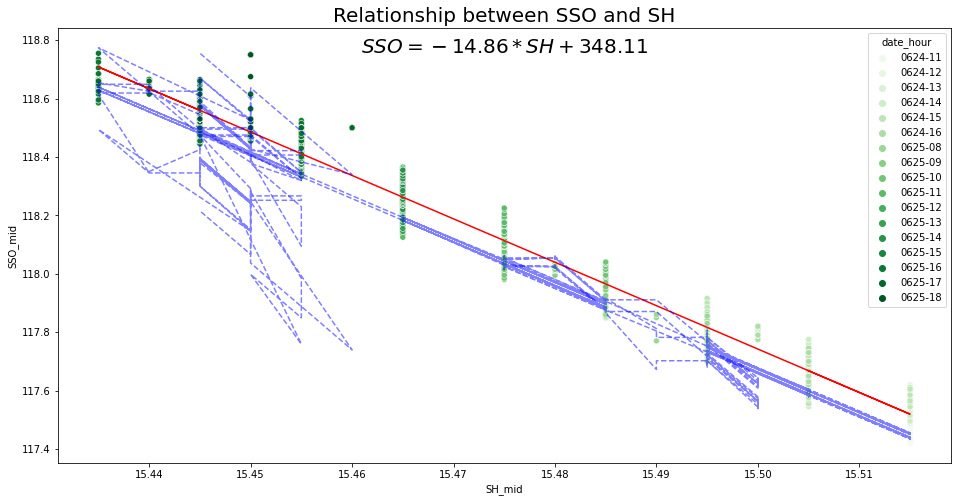

Total number of data points: 6254
Number of arbitrage opportunity: 5806
Expected Mean return of arbitrage opportunity: -0.001
	Percentage of profitable arbitrage opportunity: 40.06%
	Percentage of non-profitable arbitrage opportunity: 59.940000000000005%
Actual Mean return: 0.1364
	Percentage of profitable trade: 98.74000000000001%
	Percentage of non-profitable trade: 1.26%
9. Analysis of SH(-1x) and SSO(2x)
Relationship between SH(-1x) and SPXU(-3x)


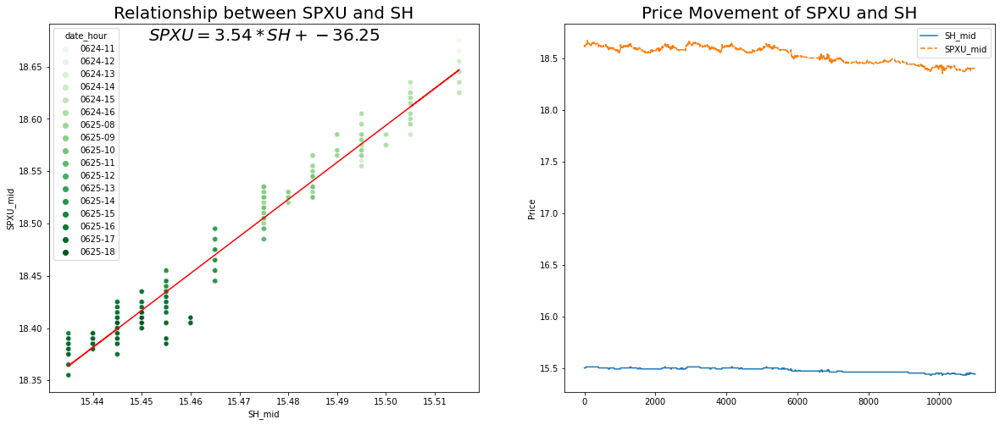

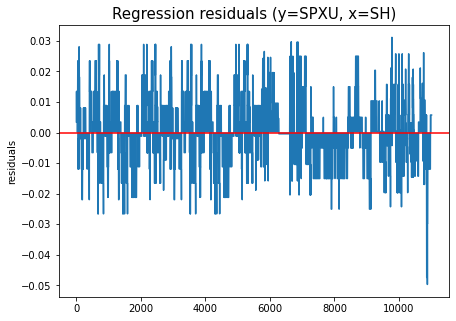

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.001717
1    0.002821
2   -0.000279
3   -0.003340
Name: pnl_abs, dtype: float64/n


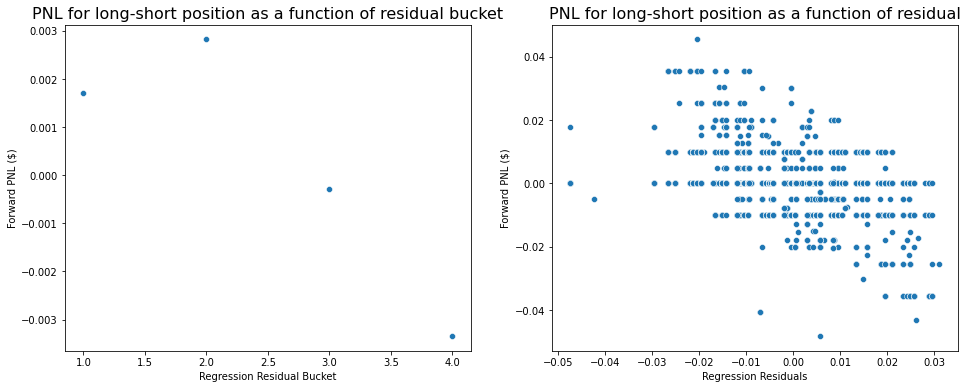

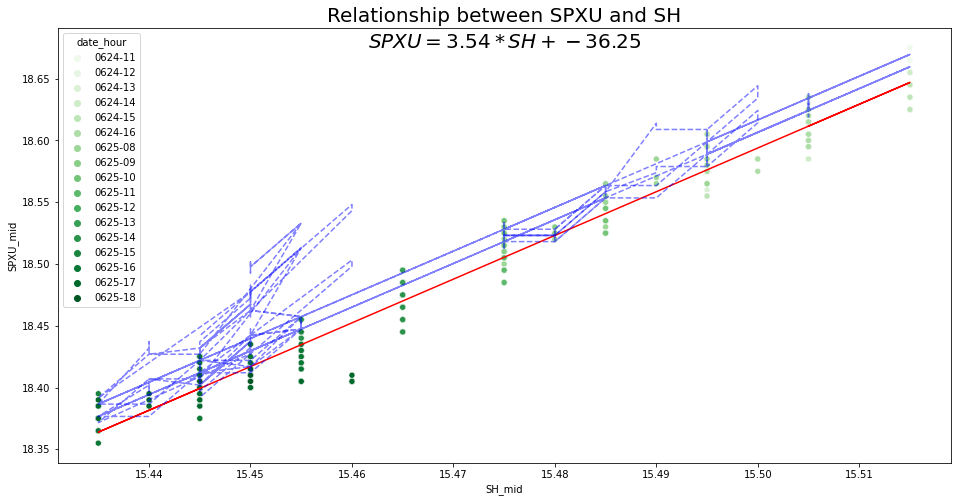

Total number of data points: 6254
Number of arbitrage opportunity: 5369
Expected Mean return of arbitrage opportunity: 0.0004
	Percentage of profitable arbitrage opportunity: 14.27%
	Percentage of non-profitable arbitrage opportunity: 85.72999999999999%
Actual Mean return: -0.048
	Percentage of profitable trade: 0.0%
	Percentage of non-profitable trade: 100.0%
10. Analysis of SH(-1x) and SPXU(-3x)
Relationship between SDS(-2x) and UPRO(3x)


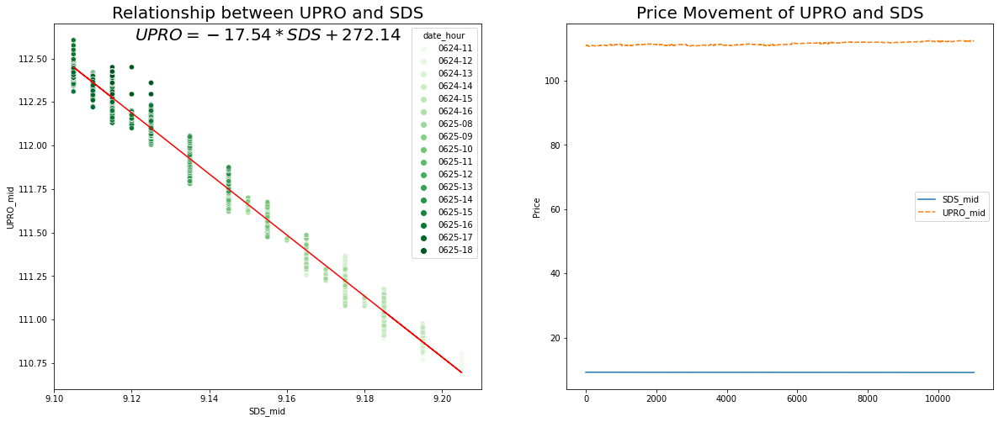

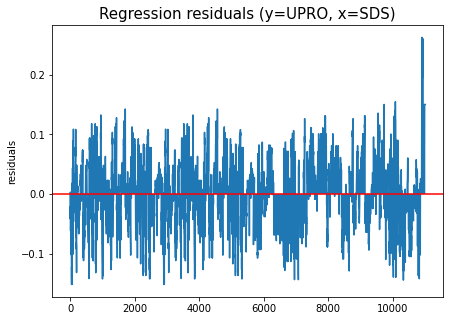

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.015104
1   -0.001249
2   -0.013098
3   -0.006133
Name: pnl_abs, dtype: float64/n


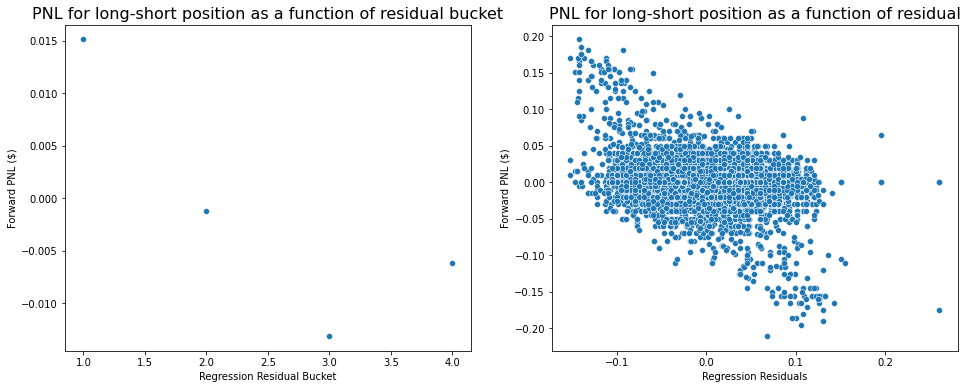

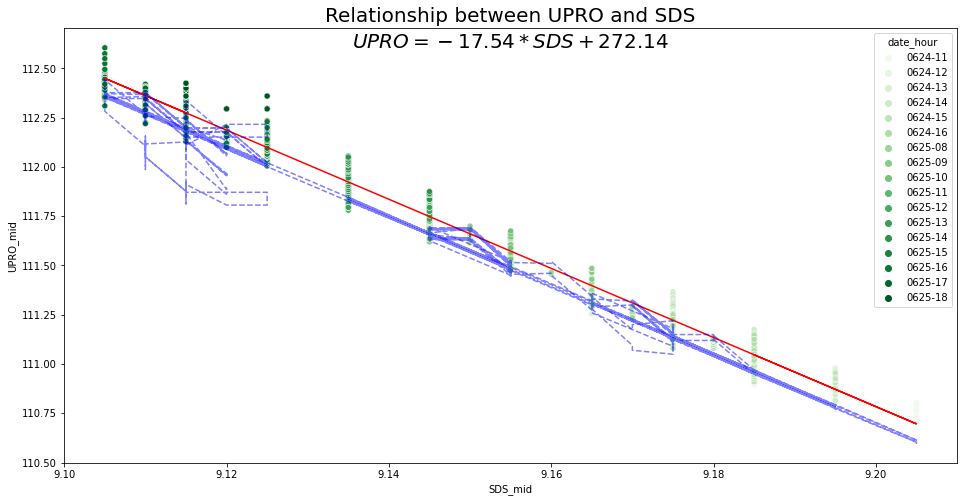

Total number of data points: 6254
Number of arbitrage opportunity: 5896
Expected Mean return of arbitrage opportunity: -0.0007
	Percentage of profitable arbitrage opportunity: 41.160000000000004%
	Percentage of non-profitable arbitrage opportunity: 58.84%
Actual Mean return: 0.1621
	Percentage of profitable trade: 98.41%
	Percentage of non-profitable trade: 1.54%
11. Analysis of SDS(-2x) and UPRO(3x)
Relationship between SDS(-2x) and SSO(2x)


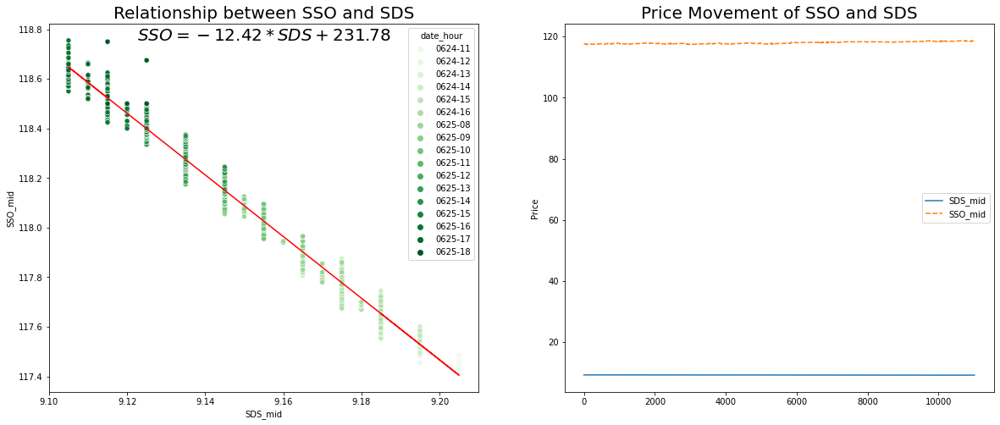

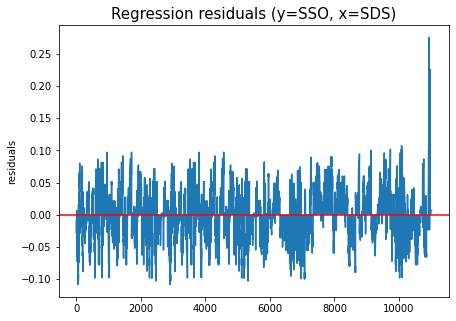

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.005967
1   -0.003613
2   -0.035534
3   -0.139167
Name: pnl_abs, dtype: float64/n


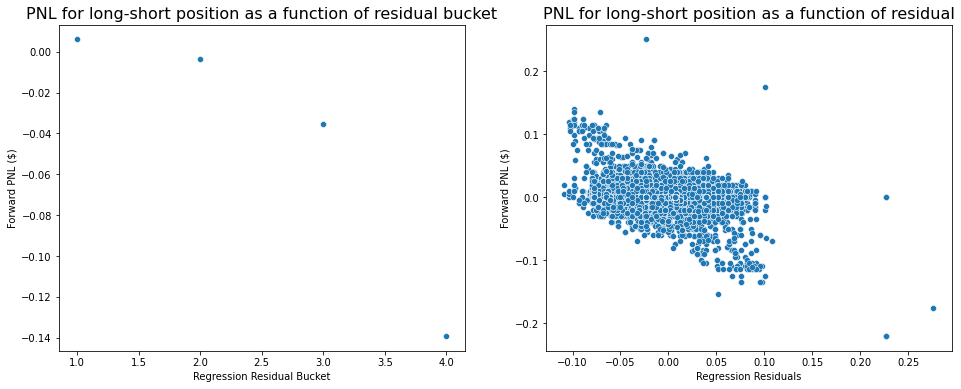

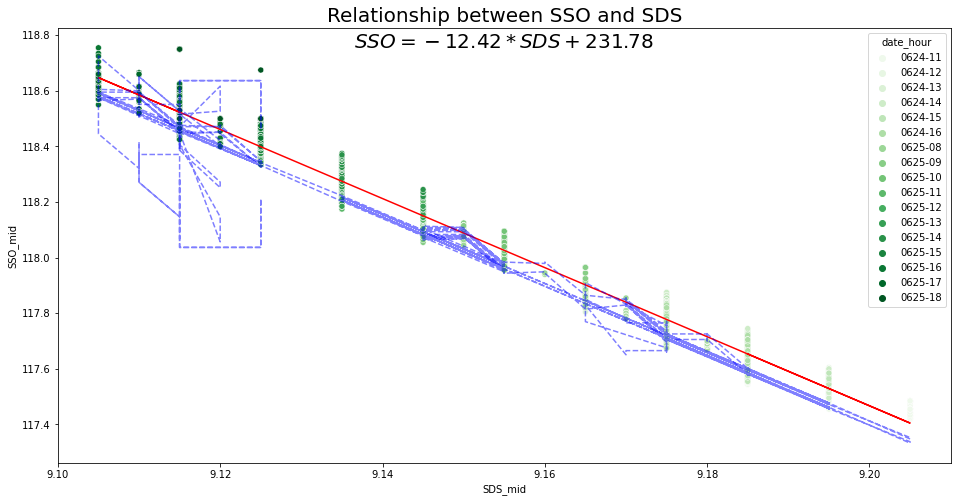

Total number of data points: 6254
Number of arbitrage opportunity: 5693
Expected Mean return of arbitrage opportunity: -0.0008
	Percentage of profitable arbitrage opportunity: 40.45%
	Percentage of non-profitable arbitrage opportunity: 59.550000000000004%
Actual Mean return: 0.1089
	Percentage of profitable trade: 97.68%
	Percentage of non-profitable trade: 2.32%
12. Analysis of SDS(-2x) and SSO(2x)
Relationship between SDS(-2x) and SPXU(-3x)


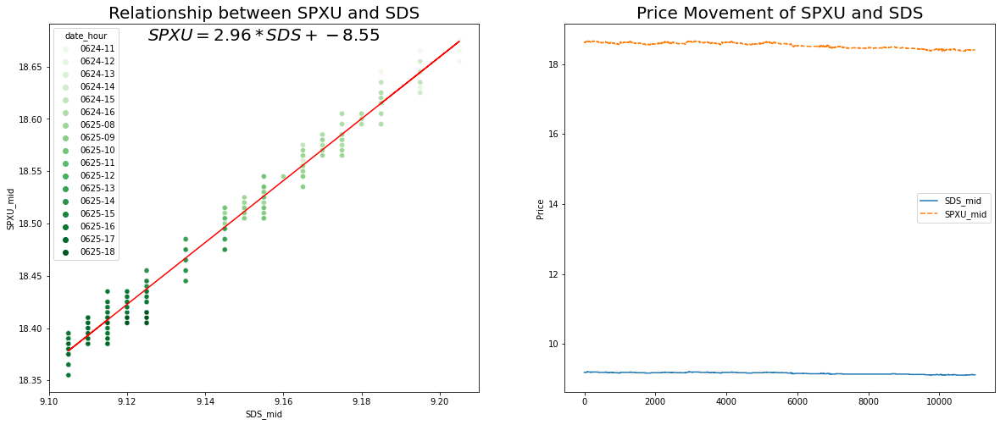

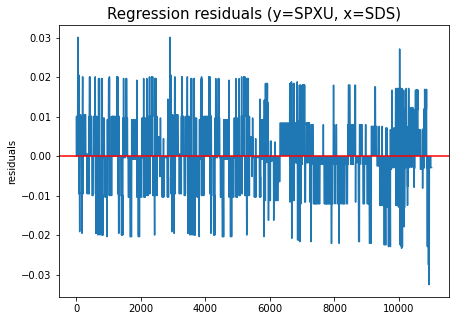

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.007580
1    0.000843
2   -0.000446
3   -0.006663
Name: pnl_abs, dtype: float64/n


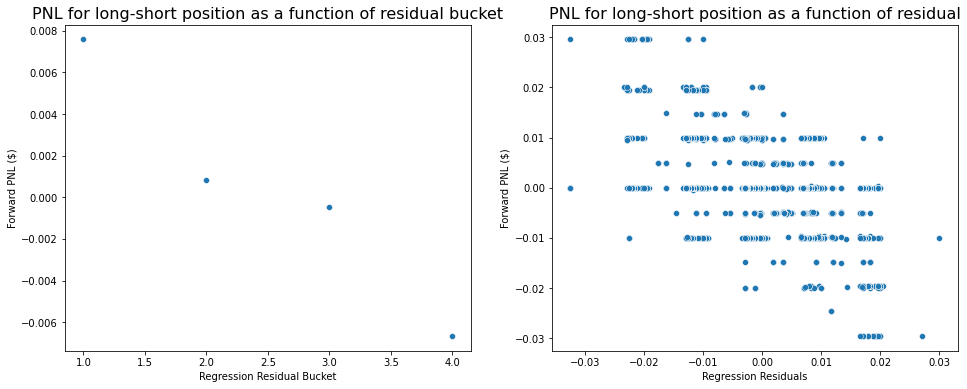

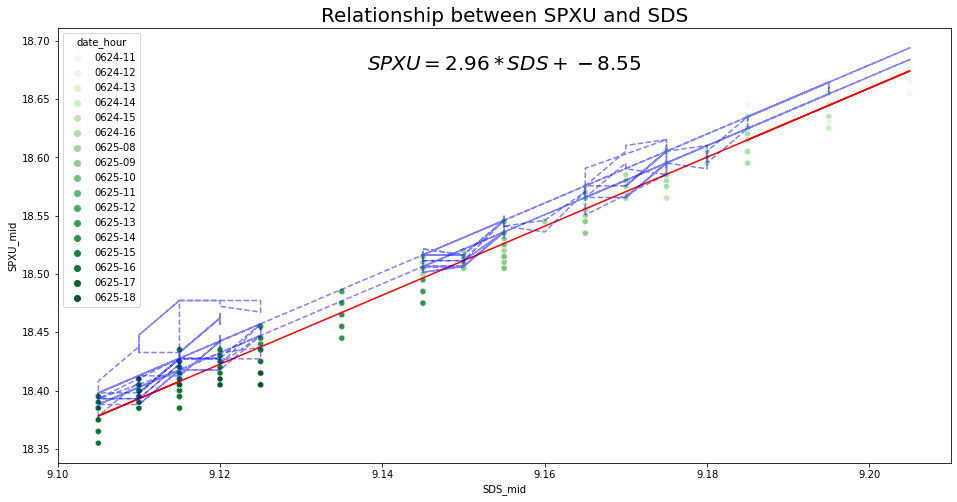

Total number of data points: 6254
Number of arbitrage opportunity: 5515
Expected Mean return of arbitrage opportunity: 0.0004
	Percentage of profitable arbitrage opportunity: 14.16%
	Percentage of non-profitable arbitrage opportunity: 85.84%
Actual Mean return: -0.0416
	Percentage of profitable trade: 0.02%
	Percentage of non-profitable trade: 99.92999999999999%
13. Analysis of SDS(-2x) and SPXU(-3x)
Relationship between UPRO(3x) and SSO(2x)


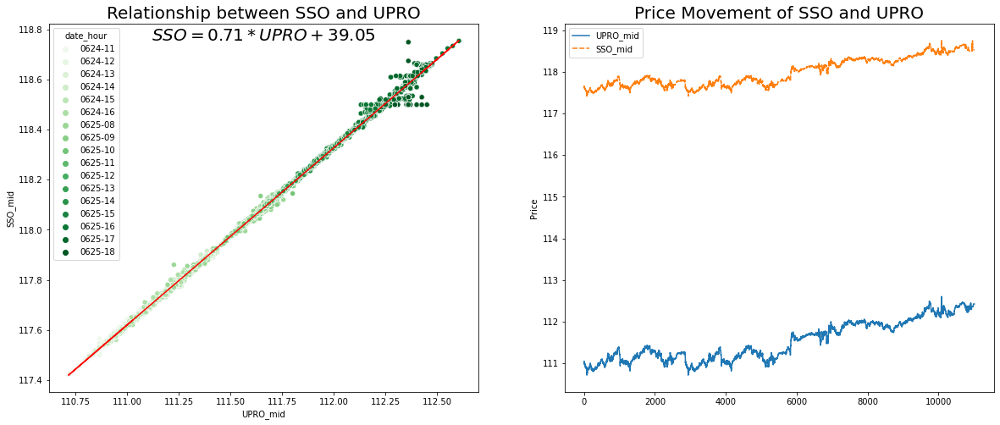

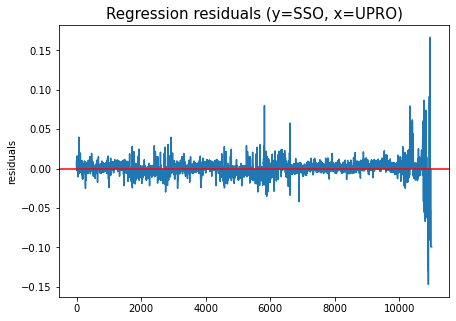

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.006916
1    0.000080
2   -0.011899
3   -0.132000
Name: pnl_abs, dtype: float64/n


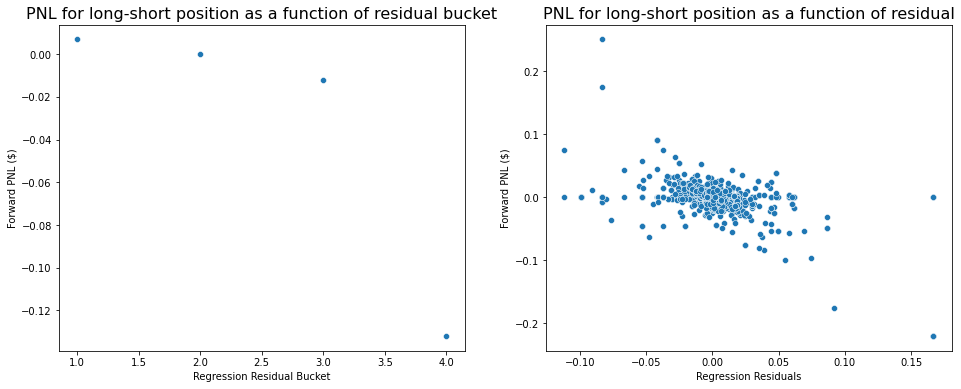

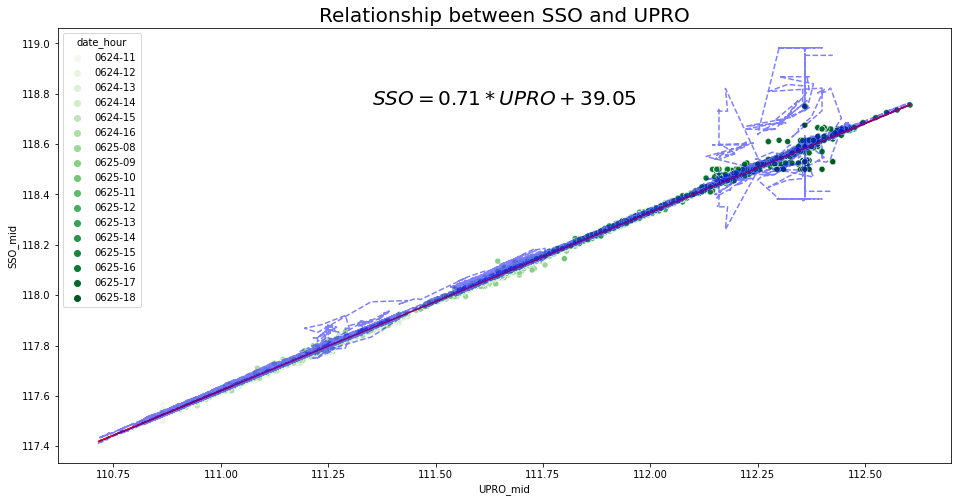

Total number of data points: 6254
Number of arbitrage opportunity: 1788
Expected Mean return of arbitrage opportunity: 0.0022
	Percentage of profitable arbitrage opportunity: 62.980000000000004%
	Percentage of non-profitable arbitrage opportunity: 37.019999999999996%
Actual Mean return: -0.0313
	Percentage of profitable trade: 0.5599999999999999%
	Percentage of non-profitable trade: 99.44%
14. Analysis of UPRO(3x) and SSO(2x)
Relationship between UPRO(3x) and SPXU(-3x)


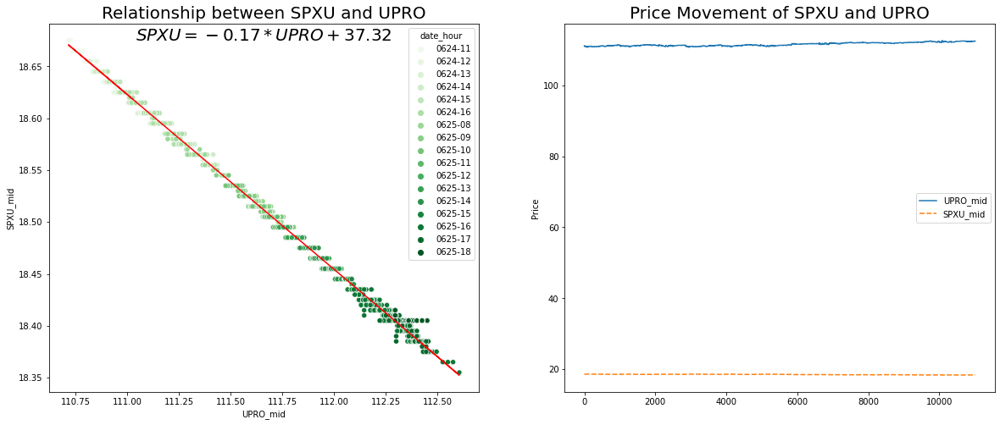

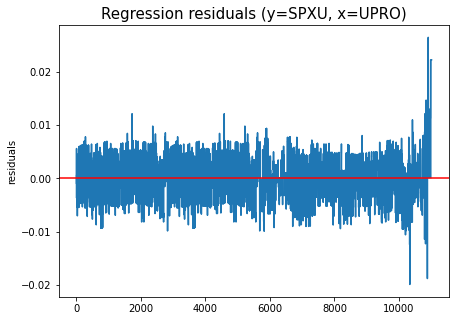

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.007197
1    0.001384
2   -0.002357
3   -0.001326
Name: pnl_abs, dtype: float64/n


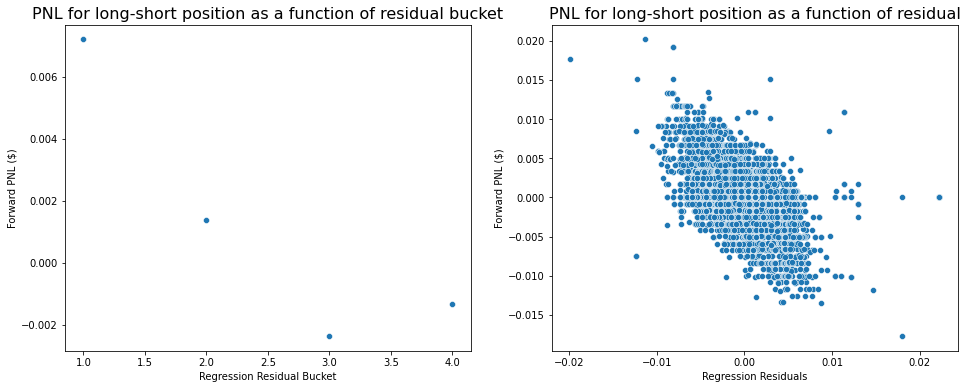

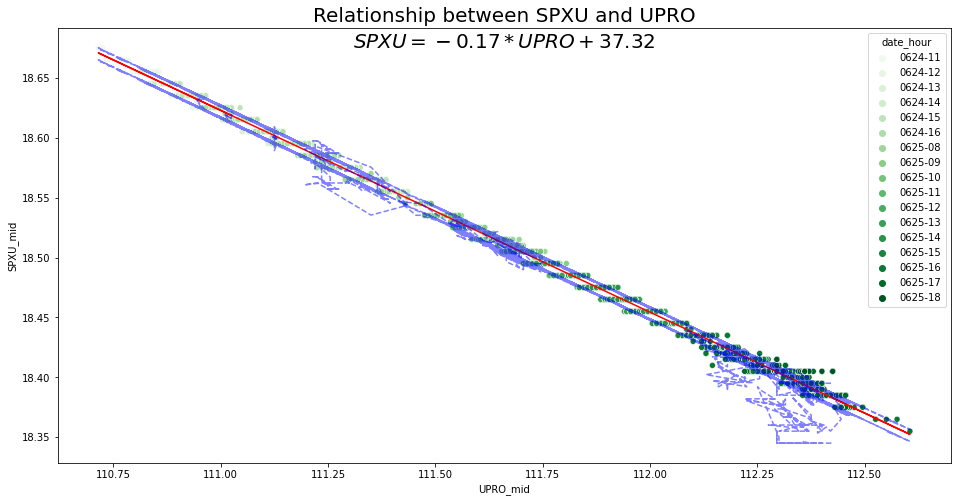

Total number of data points: 6254
Number of arbitrage opportunity: 1313
Expected Mean return of arbitrage opportunity: -0.0014
	Percentage of profitable arbitrage opportunity: 25.509999999999998%
	Percentage of non-profitable arbitrage opportunity: 74.49%
Actual Mean return: -0.0006
	Percentage of profitable trade: 33.739999999999995%
	Percentage of non-profitable trade: 66.03%
15. Analysis of UPRO(3x) and SPXU(-3x)
Relationship between SSO(2x) and SPXU(-3x)


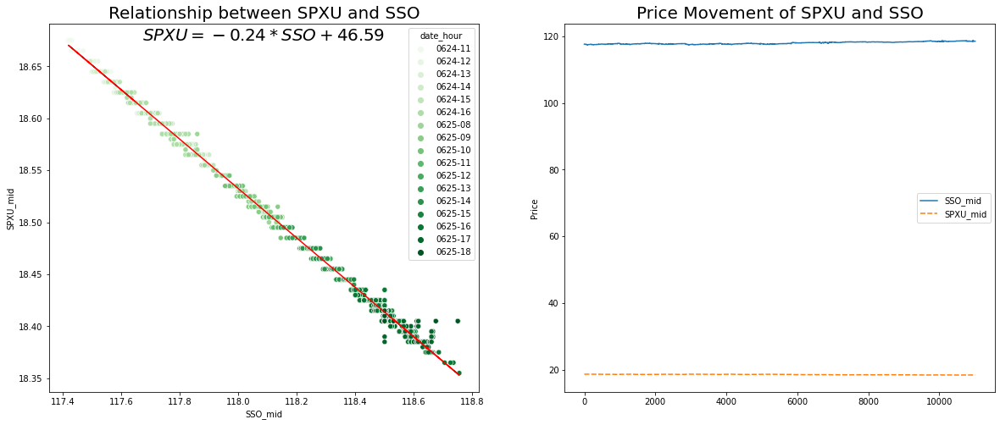

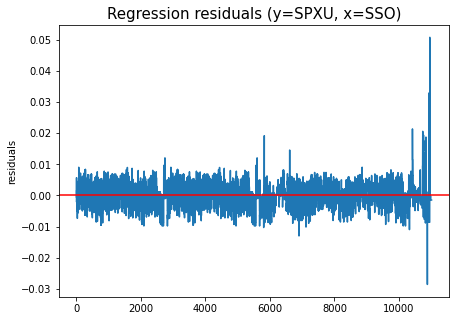

Average 20 seconds pnl for 4 bucket:
residual_bucket
0    0.000865
1   -0.003299
2   -0.014322
3   -0.031386
Name: pnl_abs, dtype: float64/n


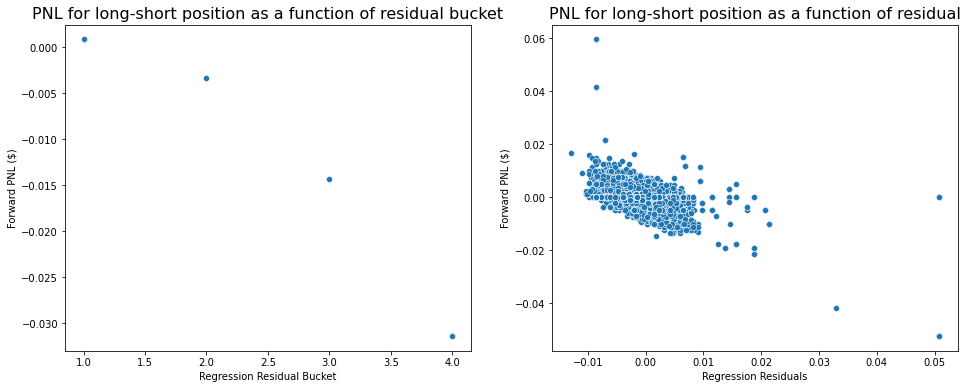

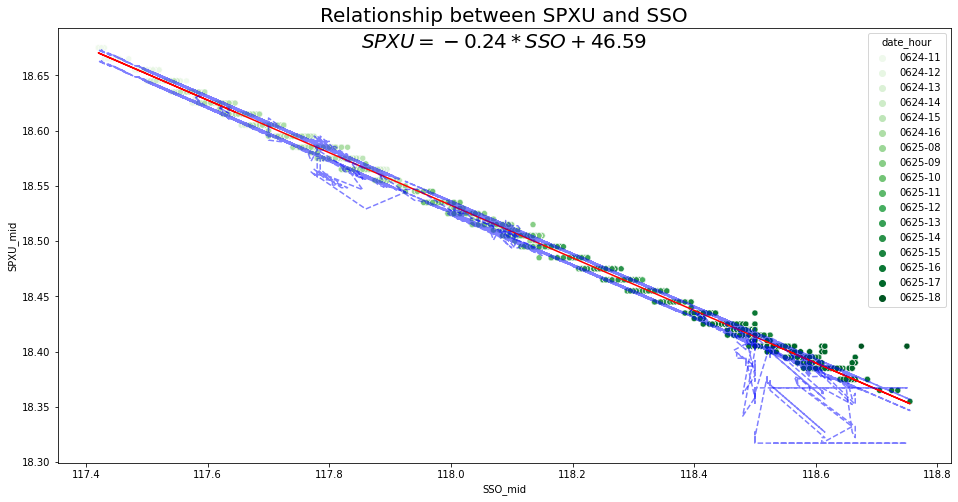

Total number of data points: 6254
Number of arbitrage opportunity: 1664
Expected Mean return of arbitrage opportunity: -0.0019
	Percentage of profitable arbitrage opportunity: 22.18%
	Percentage of non-profitable arbitrage opportunity: 77.82%
Actual Mean return: 0.0078
	Percentage of profitable trade: 38.879999999999995%
	Percentage of non-profitable trade: 60.940000000000005%


In [528]:
for i, (x_idx, y_idx) in enumerate(itertools.combinations(range(6), 2)):
    print("{}. Analysis of {}({}) and {}({})".format(i + 1, x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
    x_ticker, y_ticker = TICKERS[x_idx], TICKERS[y_idx]
    x_mid_str, y_mid_str = "{}_mid".format(x_ticker), "{}_mid".format(y_ticker)

    print("Relationship between {}({}) and {}({})".format(x_ticker, LEVERAGES[x_ticker], y_ticker, LEVERAGES[y_ticker]))
    data_pair, slope, constant = plot_multiple(all_data, TICKERS2INDEX[x_ticker], TICKERS2INDEX[y_ticker], period=None)
    pred_y = constant + slope * data_pair[x_mid_str]

    df = residual_analysis(data_pair, x_ticker, y_ticker, lookback_window=20)
    df = partition_residual(df, lookback_window=20, num_bucket=4)
    arbitrary_bound(df, x_ticker, y_ticker, slope, constant, 30)